
# Combined Ductal Pathology Continuum: `exp_2`, `exp_3`, `exp_4`, `exp_5`

This notebook pools the per-sample ductal niche feature tables from:

- `exp_5`: normal pancreas
- `exp_2`, `exp_3`, `exp_4`: PDAC samples

The goal is to test whether these samples occupy a **shared ductal pathology continuum** before we force a single combined ElPiGraph trajectory.

The notebook follows three stages:

1. Rebuild the minimal per-sample surround-context layer needed for module scoring
2. Inspect pooled PCA/UMAP mixing by sample and disease
3. Fit a pooled principal tree only after the pooled embedding looks biologically coherent

Important framing:

- interpret this as a **cross-sample ductal pathology continuum**
- do **not** over-interpret it as literal temporal evolution across patients


In [1]:

%matplotlib inline

import os
os.environ.setdefault("MPLCONFIGDIR", "/private/tmp/matplotlib")
os.environ.setdefault("NUMBA_CACHE_DIR", "/private/tmp/numba")

from pathlib import Path
import gc
import json

import anndata as ad
import elpigraph
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.collections import LineCollection
import numpy as np
import pandas as pd
import scanpy as sc
import seaborn as sns
import spatioev as se
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.metrics import adjusted_rand_score
from sklearn.neighbors import NearestNeighbors
from sklearn.preprocessing import StandardScaler
from umap import UMAP

plt.rcParams["figure.dpi"] = 110
plt.rcParams["font.size"] = 9
sns.set_style("white")

ROOT = Path("/Users/shihongwu/SpatioEv")
os.chdir(ROOT)

CACHE_DIR = ROOT / "data" / "combined_exp_2_3_4_5"
PER_SAMPLE_CACHE_DIR = CACHE_DIR / "per_sample"
CACHE_DIR.mkdir(parents=True, exist_ok=True)
PER_SAMPLE_CACHE_DIR.mkdir(parents=True, exist_ok=True)

NICHIE_KEY = "pancreatic ductal epithelium_mask_component"
GRAPH_RADIUS_PX = 30 / 0.325
SURROUND_HOPS = 5

SAMPLE_CONFIGS = [
    {
        "exp_id": "exp_5",
        "sample_id": "40331_1",
        "disease_group": "NormalPancreas",
        "differentiation_label": "NormalPancreas",
        "adata_path": "data/exp_5/40331_1_adata.h5ad",
        "annotation_path": "data/exp_5/40331_1_annotation.csv",
        "pixel_path": "data/exp_5/pixel_features.csv",
        "seg_dir": "data/exp_5/segmentation",
        "niche_table_path": "data/exp_5/niche_feature_table.csv",
        "fov_grid_cols": 3,
    },
    {
        "exp_id": "exp_2",
        "sample_id": "34434_1",
        "disease_group": "PDAC",
        "differentiation_label": "PDAC_exp_2",
        "adata_path": "data/exp_2/34434_1_adata.h5ad",
        "annotation_path": "data/exp_2/34434_1_annotation.csv",
        "pixel_path": "data/exp_2/pixel_features.csv",
        "seg_dir": "data/exp_2/segmentation",
        "niche_table_path": "data/exp_2/niche_feature_table.csv",
        "fov_grid_cols": 2,
    },
    {
        "exp_id": "exp_3",
        "sample_id": "33694_1",
        "disease_group": "PDAC",
        "differentiation_label": "PDAC_exp_3",
        "adata_path": "data/exp_3/33694_1_adata.h5ad",
        "annotation_path": "data/exp_3/33694_1_annotation.csv",
        "pixel_path": "data/exp_3/pixel_features_with_regionprops.csv",
        "seg_dir": "data/exp_3/segmentation",
        "niche_table_path": "data/exp_3/niche_feature_table.csv",
        "fov_grid_cols": 4,
    },
    {
        "exp_id": "exp_4",
        "sample_id": "35559_1",
        "disease_group": "PDAC",
        "differentiation_label": "PDAC_exp_4",
        "adata_path": "data/exp_4/35559_1_adata.h5ad",
        "annotation_path": "data/exp_4/35559_1_annotation.csv",
        "pixel_path": "data/exp_4/pixel_features.csv",
        "seg_dir": "data/exp_4/segmentation",
        "niche_table_path": "data/exp_4/niche_feature_table.csv",
        "fov_grid_cols": 3,
    },
]

MODULE_COLS = [
    "pdac_early_duct_anchor_score",
    "pdac_panin_like_dysplasia_score",
    "pdac_invasive_gland_forming_score",
    "pdac_invasion_desmoplasia_axis",
    "pdac_proliferation_axis",
    "pdac_dedifferentiation_axis",
    "pdac_duct_organization_score",
    "pdac_dysplasia_score",
    "pdac_architectural_complexity_score",
    "pdac_invasion_desmoplasia_score",
    "pdac_proliferation_score",
    "pdac_dedifferentiation_score",
]

SUPPLEMENTAL_COL_CANDIDATES = [
    "geometry__hull_circularity",
    "geometry__mean_nearest_neighbor_distance",
    "graph_boundary__boundary_fraction",
    "graph_boundary__mean_external_degree",
    "graph_surround__cross_edges_per_niche_cell",
    "topology__skeleton_tortuosity",
    "surround_prop__Fibroblasts",
    "surround_prop__Vimentin_only_mesenchyme",
    "surround_prop__Endothelial_cells",
]

GLAND_PROXY_COL_CANDIDATES = [
    "state__solidity__mean",
    "state__solidity__std",
    "state__perimeter__mean",
    "state__perimeter__std",
    "state__convex_hull_resid__mean",
    "state__convex_hull_resid__std",
]

EXTRA_PIXEL_COL_CANDIDATES = [
    "state__nc_ratio__std",
    "state__nc_ratio__iqr",
    "state__polarity_score__std",
    "state__entropy__std",
    "state__inertia__std",
    "state__lacunarity__std",
    "state__haralick_contrast__std",
    "state__haralick_correlation__mean",
    "state__haralick_energy__mean",
    "state__haralick_homogeneity__mean",
    "state__pcc_ck19_nak__mean",
    "state__pcc_ck19_nak__std",
    "state__intensity_ratio__mean",
    "state__intensity_ratio__std",
    "graph_boundary__polarity_score__boundary_minus_core",
    "graph_boundary__entropy__boundary_minus_core",
    "graph_boundary__haralick_contrast__boundary_minus_core",
    "graph_boundary__intensity_ratio__boundary_minus_core",
    "graph_boundary__pcc_ck19_nak__boundary_minus_core",
]

EPITHELIAL_INTRINSIC_MODULE_COLS = [
    "pdac_duct_organization_score",
    "pdac_dysplasia_score",
    "pdac_architectural_complexity_score",
    "pdac_proliferation_score",
    "pdac_dedifferentiation_score",
]

EPITHELIAL_INTRINSIC_FEATURE_CANDIDATES = [
    "geometry__hull_circularity",
    "geometry__mean_nearest_neighbor_distance",
    "geometry__nearest_neighbor_distance_cv",
    "geometry__edge_length_cv",
    "geometry__orientation_entropy",
    "geometry__orientation_coherence",
    "geometry__spatial_entropy",
    "geometry__cell_density_hull",
    "geometry__edge_density_hull",
    "geometry__span_ratio",
    "geometry__node_cloud_elongation",
    "topology__largest_component_fraction",
    "topology__density",
    "topology__degree_var",
    "topology__avg_clustering",
    "topology__bridge_fraction",
    "topology__skeleton_leaf_fraction",
    "topology__skeleton_branchpoint_fraction",
    "topology__skeleton_degree_cv",
    "topology__skeleton_tortuosity",
    "state__CK19_expr_z__mean",
    "state__CK19_expr__mean",
    "state__NaKATPase_expr_z__mean",
    "state__NaKATPase_expr__mean",
    "state__Ki67_expr_z__mean",
    "state__Ki67_expr__mean",
    "state__Vimentin_expr_z__mean",
    "state__Vimentin_expr__mean",
    "state__nc_ratio__mean",
    "state__nc_ratio__std",
    "state__nc_ratio__iqr",
    "state__major_minor_axis_ratio__mean",
    "state__major_minor_axis_ratio__std",
    "state__convex_hull_resid__mean",
    "state__convex_hull_resid__std",
    "state__centroid_dif__mean",
    "state__centroid_dif__std",
    "state__num_concavities__mean",
    "state__num_concavities__std",
    "state__solidity__mean",
    "state__solidity__std",
    "state__circularity__mean",
    "state__circularity__std",
    "state__boundary_irregularity__mean",
    "state__boundary_irregularity__std",
    "state__polarity_score__mean",
    "state__polarity_score__std",
    "state__entropy__mean",
    "state__entropy__std",
    "state__inertia__mean",
    "state__inertia__std",
    "state__lacunarity__mean",
    "state__lacunarity__std",
    "state__haralick_contrast__mean",
    "state__haralick_contrast__std",
    "state__haralick_correlation__mean",
    "state__haralick_energy__mean",
    "state__haralick_homogeneity__mean",
    "state__pcc_ck19_nak__mean",
    "state__pcc_ck19_nak__std",
    "state__intensity_ratio__mean",
    "state__intensity_ratio__std",
]

PANIN_VALIDATION_SCORE_COLS = [
    "panin_validation__normal_duct_like_score",
    "panin_validation__lg_panin_like_score",
    "panin_validation__hg_panin_like_score",
    "panin_validation__invasive_desmoplastic_context_score",
    "panin_validation__panin_grade_like_axis",
]

MARKER_CANDIDATES = ["FAP", "aSMA", "PDPN", "Thy1", "Ki67", "CK19", "NaKATPase", "Vimentin"]
FIBRO_MARKER_FEATURES = ["FAP_expr_z", "aSMA_expr_z", "PDPN_expr_z", "Thy1_expr_z"]
BRANCH_CONTEXT_FEATURES = [
    "surround_prop__pancreatic_ductal_epithelium",
    "surround_prop__Fibroblasts",
    "surround_prop__T_cells",
    "surround_prop__B_lineage",
    "surround_prop__Endothelial_cells",
    "surround_prop__Vimentin_only_mesenchyme",
    "surround_prop__pancreatic_acinar_epithelium",
]
BRANCH_CONTEXT_TREND_FEATURES = [
    "surround_prop__pancreatic_ductal_epithelium",
    "surround_prop__Fibroblasts",
    "surround_prop__T_cells",
    "surround_prop__B_lineage",
]
BRANCH_FIBRO_MARKER_FEATURES = [
    "surround__Fibroblasts__FAP_expr_z__mean",
    "surround__Fibroblasts__aSMA_expr_z__mean",
    "surround__Fibroblasts__PDPN_expr_z__mean",
    "surround__Fibroblasts__Thy1_expr_z__mean",
]

FORCE_REBUILD_PER_SAMPLE = False
FORCE_REBUILD_POOLED = False
RANDOM_STATE = 42
TOP_BRANCHES_FOR_CONTEXT_TRENDS = None
SIMPLIFIED_NUM_NODES = 24
TOP_BRANCH_GROUPS_FOR_SUMMARY = None
SPATIAL_VIS_SAMPLE_IDS = [cfg["sample_id"] for cfg in SAMPLE_CONFIGS]
REPRESENTATIVE_SAMPLE_ID = "33694_1"
REPRESENTATIVE_NICHE_QUANTILES = (0.15, 0.50, 0.85)

print("Cache dir:", CACHE_DIR)
print(pd.DataFrame(SAMPLE_CONFIGS)[["exp_id", "sample_id", "disease_group", "differentiation_label", "fov_grid_cols"]])


Running SCIMAP  2.3.5


/Users/shihongwu/anaconda3/envs/spatioev_env/lib/python3.11/site-packages/mpl_scatter_density/__init__.py:4: UserWarning:

pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.

/Users/shihongwu/anaconda3/envs/spatioev_env/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning:

IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html



Cache dir: /Users/shihongwu/SpatioEv/data/combined_exp_2_3_4_5
  exp_id sample_id   disease_group differentiation_label  fov_grid_cols
0  exp_5   40331_1  NormalPancreas        NormalPancreas              3
1  exp_2   34434_1            PDAC            PDAC_exp_2              2
2  exp_3   33694_1            PDAC            PDAC_exp_3              4
3  exp_4   35559_1            PDAC            PDAC_exp_4              3


In [2]:

def save_df(df, path):
    path = Path(path)
    path.parent.mkdir(parents=True, exist_ok=True)
    df.to_pickle(path)


def load_df(path):
    return pd.read_pickle(path)


def merge_annotations(adata, annotation_path):
    ann = pd.read_csv(annotation_path, index_col=0)
    keep_cols = [c for c in ["Tier_A", "Tier_B"] if c in ann.columns]
    ann = ann[keep_cols]
    adata.obs = adata.obs.join(ann, how="left")
    return adata


def merge_pixel_features(adata, pixel_path):
    pix = pd.read_csv(pixel_path)
    key_cols = ["fov", "label"]
    pix_cols = [c for c in pix.columns if c not in key_cols]

    dup_counts = pix.groupby(key_cols).size()
    if int(dup_counts.max()) <= 1:
        adata.obs = adata.obs.merge(pix, on=key_cols, how="left")
        return adata, pix_cols

    obs = adata.obs.copy()
    obs["obs_name"] = obs.index
    tmp = obs[["obs_name", "fov", "label", "X_centroid", "Y_centroid"]].merge(
        pix,
        on=key_cols,
        how="left",
    )
    tmp["centroid_dist2"] = (
        (tmp["geometric_centroid_x"] - tmp["X_centroid"]) ** 2
        + (tmp["geometric_centroid_y"] - tmp["Y_centroid"]) ** 2
    )
    pix_best = (
        tmp.sort_values(["obs_name", "centroid_dist2"], na_position="last")
        .drop_duplicates(subset=["obs_name"], keep="first")
    )
    obs_merged = (
        obs.merge(
            pix_best[["obs_name"] + pix_cols],
            on="obs_name",
            how="left",
            validate="one_to_one",
        )
        .set_index("obs_name")
        .loc[adata.obs_names]
    )
    adata.obs = obs_merged
    return adata, pix_cols


def load_preprocessed_adata(cfg):
    adata = se.load_h5ad(cfg["adata_path"])
    adata = merge_annotations(adata, cfg["annotation_path"])
    adata, pix_cols = merge_pixel_features(adata, cfg["pixel_path"])

    finite_pix_cols = [c for c in pix_cols if c in adata.obs.columns]
    if finite_pix_cols:
        keep_mask = adata.obs[finite_pix_cols].notna().all(axis=1)
        adata = adata[keep_mask].copy()

    adata = se.cluster_spatial_components_from_mask(
        adata,
        seg_dir=cfg["seg_dir"],
        label_key="Tier_A",
        label_value="pancreatic ductal epithelium",
        fov_key="fov",
        cell_label_key="label",
        connection_mode="label_adjacency",
        gap_tolerance=5,
        stitch_across_fovs=True,
        fov_grid_cols=cfg["fov_grid_cols"],
        stitch_gap_tolerance=5,
        connectivity=2,
        min_component_size=3,
        assign_singletons=True,
    )

    markers_present = [m for m in MARKER_CANDIDATES if m in adata.var_names]
    if markers_present:
        adata = se.add_obs_from_var(
            adata,
            markers=markers_present,
            zscore=True,
            overwrite=True,
        )

    adata = se.build_cell_graph(
        adata,
        feature_cols=[],
        phenotype_key=None,
        radius=GRAPH_RADIUS_PX,
        image_key="imageid",
        auto_log=False,
        scale_features=False,
        compute_weights=False,
        feature_obsm_key="cell_features",
        adjacency_key="cell_graph_connectivities",
        distance_key="cell_graph_distances",
        graph_obs_key="cell_graph_valid",
    )
    return adata


def build_sample_pathology_feature_df(cfg, force=False):
    cache_path = PER_SAMPLE_CACHE_DIR / f"{cfg['exp_id']}_pathology_feature_table.pkl"
    if cache_path.exists() and not force:
        return load_df(cache_path)

    print(f"Building pathology feature table for {cfg['exp_id']} ({cfg['sample_id']})")
    adata = load_preprocessed_adata(cfg)

    niche_feature_df = pd.read_csv(cfg["niche_table_path"], index_col=0)
    niche_key = "pancreatic ductal epithelium_mask_component"
    phenotype_labels = (
        adata.obs["Tier_A"]
        .value_counts()
        .loc[lambda s: ~s.index.isin(["noise", "Unknown"])]
        .index.tolist()
    )
    fibro_context_features = [c for c in FIBRO_MARKER_FEATURES if c in adata.obs.columns]
    phenotype_feature_map = {"Fibroblasts": fibro_context_features} if fibro_context_features else {}

    surround_context_df = se.summarize_niche_surrounding_context(
        adata,
        niche_key=niche_key,
        phenotype_key="Tier_A",
        phenotype_labels=phenotype_labels,
        phenotype_feature_map=phenotype_feature_map,
        surround_hops=SURROUND_HOPS,
    )

    context_cols = [col for col in surround_context_df.columns if col != "n_cells"]
    pathology_feature_df = niche_feature_df.merge(
        surround_context_df[context_cols],
        on=[niche_key, "image_id"],
        how="left",
    )

    pathology_module_df = se.score_pdac_niche_pathology_modules(
        pathology_feature_df,
        niche_key=niche_key,
        polarity_high_is_organized=True,
    )
    pathology_feature_df = pathology_feature_df.merge(
        pathology_module_df,
        on=[niche_key, "image_id"],
        how="left",
    )

    pathology_feature_df["exp_id"] = cfg["exp_id"]
    pathology_feature_df["sample_id"] = cfg["sample_id"]
    pathology_feature_df["disease_group"] = cfg["disease_group"]
    pathology_feature_df["differentiation_label"] = cfg["differentiation_label"]

    save_df(pathology_feature_df, cache_path)

    del adata, surround_context_df, pathology_module_df
    gc.collect()
    return pathology_feature_df


def compute_sample_mixing(X, sample_labels, disease_labels, k=15):
    X = np.asarray(X, dtype=float)
    sample_labels = np.asarray(sample_labels, dtype=object)
    disease_labels = np.asarray(disease_labels, dtype=object)

    n_neighbors = min(k + 1, len(X))
    nbrs = NearestNeighbors(n_neighbors=n_neighbors)
    nbrs.fit(X)
    _, idx = nbrs.kneighbors(X)
    nn_idx = idx[:, 1:]

    same_sample = (sample_labels[nn_idx] == sample_labels[:, None]).mean(axis=1)
    same_disease = (disease_labels[nn_idx] == disease_labels[:, None]).mean(axis=1)
    return pd.DataFrame(
        {
            "same_sample_fraction": same_sample,
            "same_disease_fraction": same_disease,
        }
    )


def resolve_palette_mapping(df, color, palette="tab10"):
    categories = [x for x in pd.Series(df[color]).dropna().unique().tolist()]
    if isinstance(palette, dict):
        return {cat: palette.get(cat, "#7f7f7f") for cat in categories}
    colors = sns.color_palette(palette, n_colors=max(len(categories), 1))
    return dict(zip(categories, colors))


def get_embedding_limits(df, x, y, pad_frac=0.03):
    x_vals = pd.to_numeric(df[x], errors="coerce")
    y_vals = pd.to_numeric(df[y], errors="coerce")
    xmin, xmax = float(x_vals.min()), float(x_vals.max())
    ymin, ymax = float(y_vals.min()), float(y_vals.max())
    xpad = max((xmax - xmin) * pad_frac, 1e-6)
    ypad = max((ymax - ymin) * pad_frac, 1e-6)
    return (xmin - xpad, xmax + xpad), (ymin - ypad, ymax + ypad)


def plot_categorical_embedding(ax, df, x, y, color, title, palette="tab10", size=9):
    sns.scatterplot(
        data=df,
        x=x,
        y=y,
        hue=color,
        palette=palette,
        s=size,
        linewidth=0,
        alpha=0.85,
        ax=ax,
    )
    ax.set_title(title)
    ax.grid(False)
    ax.legend(frameon=False, fontsize=7, loc="best")


def plot_continuous_embedding(ax, df, x, y, color, title, cmap="viridis", size=10):
    sc = ax.scatter(
        df[x],
        df[y],
        c=pd.to_numeric(df[color], errors="coerce"),
        cmap=cmap,
        s=size,
        linewidths=0,
        alpha=0.85,
    )
    ax.set_title(title)
    ax.grid(False)
    plt.colorbar(sc, ax=ax, fraction=0.046, pad=0.04)


def plot_categorical_embedding_facets(
    df,
    facet_col,
    x,
    y,
    color,
    palette="tab10",
    title_prefix="",
    size=6,
    alpha=0.85,
    n_cols=2,
):
    facet_values = [x for x in pd.Series(df[facet_col]).dropna().unique().tolist()]
    palette_map = resolve_palette_mapping(df, color, palette=palette)
    xlim, ylim = get_embedding_limits(df, x, y)

    n_rows = int(np.ceil(len(facet_values) / n_cols))
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(4.1 * n_cols, 3.9 * n_rows), sharex=True, sharey=True)
    axes = np.array(axes).reshape(-1)

    for ax, value in zip(axes, facet_values):
        sub = df[df[facet_col] == value].copy()
        if color == facet_col or sub[color].nunique(dropna=True) <= 1:
            point_color = palette_map.get(value, "#7f7f7f")
            ax.scatter(sub[x], sub[y], s=size, c=[point_color], alpha=alpha, linewidths=0)
        else:
            sns.scatterplot(
                data=sub,
                x=x,
                y=y,
                hue=color,
                palette=palette_map,
                s=size,
                linewidth=0,
                alpha=alpha,
                legend=False,
                ax=ax,
            )
        ax.set_title(f"{title_prefix}{value}")
        ax.set_xlim(*xlim)
        ax.set_ylim(*ylim)
        ax.grid(False)

    for ax in axes[len(facet_values):]:
        ax.axis("off")

    plt.tight_layout()
    plt.show()


def plot_continuous_embedding_facets(
    df,
    facet_col,
    x,
    y,
    color,
    cmap="viridis",
    title_prefix="",
    size=6,
    alpha=0.85,
    n_cols=2,
):
    facet_values = [x for x in pd.Series(df[facet_col]).dropna().unique().tolist()]
    xlim, ylim = get_embedding_limits(df, x, y)
    vals = pd.to_numeric(df[color], errors="coerce")
    vmin = float(vals.min())
    vmax = float(vals.max())

    n_rows = int(np.ceil(len(facet_values) / n_cols))
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(4.1 * n_cols, 3.9 * n_rows), sharex=True, sharey=True)
    axes = np.array(axes).reshape(-1)
    sc = None

    for ax, value in zip(axes, facet_values):
        sub = df[df[facet_col] == value].copy()
        sc = ax.scatter(
            sub[x],
            sub[y],
            c=pd.to_numeric(sub[color], errors="coerce"),
            cmap=cmap,
            vmin=vmin,
            vmax=vmax,
            s=size,
            alpha=alpha,
            linewidths=0,
        )
        ax.set_title(f"{title_prefix}{value}")
        ax.set_xlim(*xlim)
        ax.set_ylim(*ylim)
        ax.grid(False)

    for ax in axes[len(facet_values):]:
        ax.axis("off")

    if sc is not None:
        fig.colorbar(sc, ax=axes.tolist(), fraction=0.025, pad=0.02)

    plt.tight_layout()
    plt.show()


def lowess_smooth(x, y, frac=0.3):
    import statsmodels.api as ssm

    tmp = pd.DataFrame({"x": x, "y": y}).dropna().sort_values("x")
    if len(tmp) < 10:
        return None
    if tmp["x"].nunique() < 8:
        return None
    if not np.isfinite(tmp["y"]).all():
        return None
    if tmp["y"].std(ddof=0) <= 1e-12:
        return None
    return ssm.nonparametric.lowess(tmp["y"], tmp["x"], frac=frac, return_sorted=True)


def prepare_feature_matrix(
    df,
    candidate_cols,
    priority_cols=None,
    max_na_frac=0.35,
    corr_threshold=0.95,
):
    candidate_cols = [c for c in dict.fromkeys(candidate_cols) if c in df.columns]
    priority_cols = [c for c in (priority_cols or []) if c in candidate_cols]
    X = df[candidate_cols].apply(pd.to_numeric, errors="coerce")
    na_frac = X.isna().mean()
    availability_df = pd.DataFrame(
        {
            "feature": candidate_cols,
            "na_fraction": [na_frac.get(c, np.nan) for c in candidate_cols],
        }
    ).sort_values(["na_fraction", "feature"])

    X = X.loc[:, na_frac < max_na_frac]
    X = X.apply(lambda col: col.fillna(col.median()), axis=0)
    X = X.loc[:, X.var() > 1e-8]

    priority_cols = [c for c in priority_cols if c in X.columns]
    candidate_cols = [c for c in X.columns if c not in priority_cols]
    selected_cols = list(priority_cols)
    if len(X.columns) > 0:
        corr_abs = X.corr().abs()
        for col in candidate_cols:
            if len(selected_cols) == 0:
                selected_cols.append(col)
                continue
            col_corr = corr_abs.loc[col, selected_cols].dropna()
            max_corr = col_corr.max() if len(col_corr) > 0 else np.nan
            if (not np.isfinite(max_corr)) or (max_corr < corr_threshold):
                selected_cols.append(col)
    X = X[selected_cols]
    return X, selected_cols, availability_df


def zscore_numeric_series(series):
    values = pd.to_numeric(series, errors="coerce").to_numpy(dtype=float)
    finite = np.isfinite(values)
    out = np.full(len(values), np.nan, dtype=float)
    if finite.sum() < 2:
        return out
    mean = values[finite].mean()
    std = values[finite].std(ddof=0)
    if np.isclose(std, 0.0):
        return out
    out[finite] = (values[finite] - mean) / std
    return out


def score_signed_feature_module(df, specs, min_features=2):
    parts = []
    resolved = []
    for sign, candidates in specs:
        resolved_col = next((col for col in candidates if col in df.columns), None)
        if resolved_col is None:
            continue
        z = zscore_numeric_series(df[resolved_col])
        if np.isfinite(z).sum() < 2:
            continue
        parts.append(float(sign) * z)
        resolved.append((resolved_col, float(sign)))
    if len(parts) < min_features:
        return np.full(len(df), np.nan, dtype=float), resolved
    stacked = np.vstack(parts)
    finite_counts = np.isfinite(stacked).sum(axis=0)
    score = np.nanmean(stacked, axis=0)
    score[finite_counts == 0] = np.nan
    return score, resolved


def score_panin_morphology_validation(df, min_features=2):
    specs = {
        "panin_validation__normal_duct_like_score": [
            (1.0, ["pdac_duct_organization_score"]),
            (-1.0, ["pdac_dysplasia_score"]),
            (-1.0, ["pdac_architectural_complexity_score"]),
            (-1.0, ["pdac_proliferation_score"]),
            (-1.0, ["pdac_dedifferentiation_score"]),
            (1.0, ["state__CK19_expr_z__mean", "state__CK19_expr__mean"]),
            (1.0, ["state__NaKATPase_expr_z__mean", "state__NaKATPase_expr__mean"]),
            (1.0, ["state__polarity_score__mean", "state__polarity_score__median"]),
            (1.0, ["state__solidity__mean"]),
            (-1.0, ["state__boundary_irregularity__mean"]),
        ],
        "panin_validation__lg_panin_like_score": [
            (1.0, ["pdac_dysplasia_score"]),
            (1.0, ["pdac_architectural_complexity_score"]),
            (1.0, ["state__CK19_expr_z__mean", "state__CK19_expr__mean"]),
            (1.0, ["state__NaKATPase_expr_z__mean", "state__NaKATPase_expr__mean"]),
            (1.0, ["state__nc_ratio__mean"]),
            (1.0, ["state__major_minor_axis_ratio__mean"]),
            (-1.0, ["pdac_proliferation_score"]),
            (-1.0, ["pdac_dedifferentiation_score"]),
            (-1.0, ["pdac_invasion_desmoplasia_score"]),
        ],
        "panin_validation__hg_panin_like_score": [
            (1.0, ["pdac_dysplasia_score"]),
            (1.0, ["pdac_architectural_complexity_score"]),
            (1.0, ["pdac_proliferation_score"]),
            (1.0, ["pdac_dedifferentiation_score"]),
            (1.0, ["state__Ki67_expr_z__mean", "state__Ki67_expr__mean"]),
            (1.0, ["state__nc_ratio__mean"]),
            (1.0, ["state__boundary_irregularity__mean"]),
            (1.0, ["state__num_concavities__mean"]),
            (-1.0, ["pdac_duct_organization_score"]),
            (-1.0, ["state__polarity_score__mean", "state__polarity_score__median"]),
            (-1.0, ["state__solidity__mean"]),
        ],
        "panin_validation__invasive_desmoplastic_context_score": [
            (1.0, ["pdac_invasion_desmoplasia_score", "pdac_invasion_desmoplasia_axis"]),
            (1.0, ["pdac_dedifferentiation_score", "pdac_dedifferentiation_axis"]),
            (1.0, ["graph_boundary__boundary_fraction"]),
            (1.0, ["graph_boundary__mean_external_degree"]),
            (1.0, ["graph_surround__cross_edges_per_niche_cell"]),
            (1.0, ["surround_prop__Fibroblasts"]),
            (1.0, ["surround__Fibroblasts__FAP_expr_z__mean"]),
            (1.0, ["surround__Fibroblasts__aSMA_expr_z__mean"]),
            (-1.0, ["pdac_duct_organization_score"]),
        ],
    }
    out = pd.DataFrame(index=df.index)
    resolved_rows = []
    for score_name, score_specs in specs.items():
        score, resolved = score_signed_feature_module(
            df,
            score_specs,
            min_features=min_features,
        )
        out[score_name] = score
        out[f"{score_name}__n_features"] = len(resolved)
        for feature, sign in resolved:
            resolved_rows.append(
                {
                    "score": score_name,
                    "feature": feature,
                    "sign": sign,
                }
            )

    normal_z = zscore_numeric_series(out["panin_validation__normal_duct_like_score"])
    lg_z = zscore_numeric_series(out["panin_validation__lg_panin_like_score"])
    hg_z = zscore_numeric_series(out["panin_validation__hg_panin_like_score"])
    invasive_z = zscore_numeric_series(out["panin_validation__invasive_desmoplastic_context_score"])
    out["panin_validation__panin_grade_like_axis"] = np.nanmean(
        np.vstack([-normal_z, lg_z, hg_z, invasive_z]),
        axis=0,
    )
    return out, pd.DataFrame(resolved_rows)


def plot_pseudotime_score_trends(
    df,
    score_cols,
    pseudotime_col,
    hue_col="disease_group",
    hue_order=None,
    palette=None,
    n_cols=2,
    figsize_scale=3.0,
    lowess_frac=0.3,
    point_alpha=0.04,
    point_size=4,
    min_points=40,
):
    use_cols = [c for c in score_cols if c in df.columns]
    if len(use_cols) == 0:
        print("No score columns available for trend plotting.")
        return
    plot_df = df[[pseudotime_col, hue_col] + use_cols].copy()
    plot_df[pseudotime_col] = pd.to_numeric(plot_df[pseudotime_col], errors="coerce")
    if hue_order is None:
        hue_order = plot_df[hue_col].dropna().astype(str).unique().tolist()
    palette = palette or resolve_palette_mapping(plot_df, hue_col, palette="tab10")

    n_rows = int(np.ceil(len(use_cols) / n_cols))
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(8.5, figsize_scale * n_rows))
    axes = np.array(axes).reshape(-1)
    for ax, score_col in zip(axes, use_cols):
        for hue_value in hue_order:
            sub = plot_df[plot_df[hue_col].astype(str) == str(hue_value)].copy()
            sub[score_col] = pd.to_numeric(sub[score_col], errors="coerce")
            sub = sub[[pseudotime_col, score_col]].dropna().sort_values(pseudotime_col)
            if len(sub) < min_points:
                continue
            color = palette.get(hue_value, "#4d4d4d") if isinstance(palette, dict) else None
            ax.scatter(
                sub[pseudotime_col],
                sub[score_col],
                s=point_size,
                alpha=point_alpha,
                c=[color] if color is not None else None,
                linewidths=0,
            )
            smooth = lowess_smooth(sub[pseudotime_col], sub[score_col], frac=lowess_frac)
            if smooth is not None:
                ax.plot(
                    smooth[:, 0],
                    smooth[:, 1],
                    color=color,
                    linewidth=1.8,
                    label=str(hue_value),
                )
        ax.set_title(clean_spatial_feature_name(score_col))
        ax.set_xlabel(pseudotime_col)
        ax.grid(False)
    for ax in axes[len(use_cols):]:
        ax.axis("off")
    handles, labels = axes[0].get_legend_handles_labels()
    if handles:
        axes[0].legend(frameon=False, fontsize=7, loc="best")
    plt.tight_layout()
    plt.show()


def get_sample_cfg(sample_id):
    for cfg in SAMPLE_CONFIGS:
        if cfg["sample_id"] == sample_id:
            return cfg
    raise KeyError(f"Unknown sample_id: {sample_id}")


def build_tree_graph(pg_tree):
    edges = np.asarray(pg_tree["Edges"][0], dtype=int)
    adjacency = {}
    for a, b in edges:
        a = int(a)
        b = int(b)
        adjacency.setdefault(a, set()).add(b)
        adjacency.setdefault(b, set()).add(a)
    return edges, adjacency


def root_tree(adjacency, root_node):
    parent = {int(root_node): None}
    depth = {int(root_node): 0}
    children = {int(root_node): []}
    stack = [int(root_node)]

    while stack:
        node = stack.pop()
        for nbr in adjacency.get(node, []):
            if nbr in parent:
                continue
            parent[nbr] = node
            depth[nbr] = depth[node] + 1
            children.setdefault(node, []).append(nbr)
            children.setdefault(nbr, [])
            stack.append(nbr)
    return parent, children, depth


def summarize_tree_nodes(df, pg_tree, root_node, node_col="simple_node_id", branch_col="major_branch"):
    edges, adjacency = build_tree_graph(pg_tree)
    parent, children, depth = root_tree(adjacency, root_node)
    node_counts = df[node_col].dropna().astype(int).value_counts()
    rows = []
    for node_id in sorted(adjacency):
        sub = df[df[node_col] == node_id]
        branch_counts = (
            sub[branch_col].value_counts(dropna=True).head(3).to_dict()
            if branch_col in sub.columns
            else {}
        )
        rows.append(
            {
                "node_id": int(node_id),
                "parent": parent.get(int(node_id)),
                "depth_from_root": depth.get(int(node_id)),
                "degree": len(adjacency.get(int(node_id), [])),
                "n_projected_niches": int(node_counts.get(int(node_id), 0)),
                "children": ",".join(str(int(x)) for x in sorted(children.get(int(node_id), []))),
                "top_branch_labels": branch_counts,
            }
        )
    return pd.DataFrame(rows)


def _path_edges(path, edge_lookup):
    edges = []
    for a, b in zip(path[:-1], path[1:]):
        key = frozenset((int(a), int(b)))
        if key not in edge_lookup:
            raise ValueError(f"Path edge {a}-{b} is not present in the simplified tree.")
        edges.append(edge_lookup[key])
    return set(edges)


def shortest_tree_path(adjacency, start, end):
    start = int(start)
    end = int(end)
    queue = [(start, [start])]
    seen = {start}
    while queue:
        node, path = queue.pop(0)
        if node == end:
            return path
        for nbr in sorted(adjacency.get(node, [])):
            nbr = int(nbr)
            if nbr in seen:
                continue
            seen.add(nbr)
            queue.append((nbr, path + [nbr]))
    raise ValueError(f"No path found between tree nodes {start} and {end}.")


def component_after_cut(adjacency, start, blocked):
    start = int(start)
    blocked = int(blocked)
    stack = [start]
    seen = {blocked}
    component = set()
    while stack:
        node = stack.pop()
        if node in seen:
            continue
        seen.add(node)
        component.add(node)
        for nbr in adjacency.get(node, []):
            if nbr not in seen:
                stack.append(int(nbr))
    return component


def infer_auto_simple_tree_branch_paths(
    df,
    pg_tree,
    node_col="simple_node_id",
    normal_label="NormalPancreas",
    disease_col="disease_group",
    early_col="pdac_early_duct_anchor_score",
):
    edges, adjacency = build_tree_graph(pg_tree)
    node_counts = df[node_col].dropna().astype(int).value_counts()

    hub_node = max(
        adjacency,
        key=lambda node: (len(adjacency[node]), int(node_counts.get(node, 0))),
    )
    leaves = sorted([node for node, nbrs in adjacency.items() if len(nbrs) == 1])

    leaf_rows = []
    for leaf in leaves:
        sub = df[df[node_col] == leaf]
        n = int(len(sub))
        normal_fraction = (
            float((sub[disease_col] == normal_label).mean())
            if disease_col in sub.columns and n > 0
            else np.nan
        )
        early_mean = (
            float(pd.to_numeric(sub[early_col], errors="coerce").mean())
            if early_col in sub.columns and n > 0
            else np.nan
        )
        leaf_rows.append(
            {
                "leaf_node": int(leaf),
                "n_projected_niches": n,
                "normal_fraction": normal_fraction,
                "early_anchor_mean": early_mean,
            }
        )
    leaf_score_df = pd.DataFrame(leaf_rows)
    leaf_score_df["_normal_rank"] = leaf_score_df["normal_fraction"].fillna(-np.inf)
    leaf_score_df["_early_rank"] = leaf_score_df["early_anchor_mean"].fillna(-np.inf)
    leaf_score_df = leaf_score_df.sort_values(
        ["_normal_rank", "_early_rank", "n_projected_niches"],
        ascending=[False, False, False],
    )
    trunk_endpoint = int(leaf_score_df.iloc[0]["leaf_node"])
    trunk_path = shortest_tree_path(adjacency, trunk_endpoint, hub_node)
    trunk_side_node = trunk_path[-2] if len(trunk_path) > 1 else None

    branch_paths = {}
    subbranch_paths = {}
    branch_rows = []
    for entry_node in sorted(adjacency[hub_node]):
        entry_node = int(entry_node)
        if entry_node == trunk_side_node:
            continue
        component_nodes = component_after_cut(adjacency, entry_node, hub_node)
        terminal_leaves = sorted([node for node in component_nodes if len(adjacency[node]) == 1])
        label = f"branch {entry_node}"

        if len(terminal_leaves) == 1:
            path = shortest_tree_path(adjacency, hub_node, terminal_leaves[0])
        else:
            path = [int(hub_node), int(entry_node)]
        branch_paths[label] = path

        for idx, leaf in enumerate(terminal_leaves):
            if len(terminal_leaves) <= 1:
                continue
            suffix = chr(ord("a") + idx)
            subbranch_paths[f"{label}.{suffix}"] = shortest_tree_path(adjacency, entry_node, leaf)

        branch_rows.append(
            {
                "label": label,
                "entry_node": entry_node,
                "n_nodes": len(component_nodes),
                "terminal_leaves": ",".join(map(str, terminal_leaves)),
                "path": "-".join(map(str, path)),
                "n_projected_niches": int(df[df[node_col].isin(component_nodes)].shape[0]),
            }
        )

    inference_summary_df = pd.DataFrame(
        [
            {
                "hub_node": int(hub_node),
                "hub_degree": len(adjacency[hub_node]),
                "trunk_endpoint": int(trunk_endpoint),
                "trunk_path": "-".join(map(str, trunk_path)),
                "n_branches": len(branch_paths),
            }
        ]
    )
    branch_inference_df = pd.DataFrame(branch_rows)
    leaf_score_df = leaf_score_df.drop(columns=["_normal_rank", "_early_rank"])
    return trunk_path, branch_paths, subbranch_paths, inference_summary_df, branch_inference_df, leaf_score_df


def assign_simple_tree_branches_from_paths(
    df,
    pg_tree,
    trunk_path,
    branch_paths,
    subbranch_paths=None,
    node_col="simple_node_id",
    edge_col="simple_edge_id",
    out_col="major_branch",
    promote_subbranches=True,
):
    subbranch_paths = subbranch_paths or {}
    edges, adjacency = build_tree_graph(pg_tree)
    edge_lookup = {
        frozenset((int(a), int(b))): edge_idx
        for edge_idx, (a, b) in enumerate(edges)
    }

    trunk_nodes = {int(x) for x in trunk_path}
    trunk_edges = _path_edges(trunk_path, edge_lookup)
    first_branch_node = int(trunk_path[-1])

    branch_defs = {}
    for label, path in branch_paths.items():
        path = [int(x) for x in path]
        nodes = set(path[1:])
        edge_ids = _path_edges(path, edge_lookup)
        sub_defs = {}
        for sub_label, sub_path in subbranch_paths.items():
            if not sub_label.startswith(f"{label}."):
                continue
            sub_path = [int(x) for x in sub_path]
            nodes.update(sub_path)
            edge_ids |= _path_edges(sub_path, edge_lookup)
            sub_defs[sub_label] = {
                "nodes": set(sub_path[1:]),
                "edges": _path_edges(sub_path, edge_lookup),
                "path": sub_path,
            }
        branch_defs[label] = {
            "path": path,
            "nodes": nodes,
            "edges": edge_ids,
            "subbranches": sub_defs,
        }

    out = df.copy()

    def _assign_major(row):
        edge_id = row.get(edge_col, np.nan)
        node_id = row.get(node_col, np.nan)
        if pd.notna(edge_id):
            edge_id = int(edge_id)
            if edge_id in trunk_edges:
                return "trunk"
            for label, info in branch_defs.items():
                if edge_id in info["edges"]:
                    return label
        if pd.notna(node_id):
            node_id = int(node_id)
            if node_id in trunk_nodes:
                return "trunk"
            for label, info in branch_defs.items():
                if node_id in info["nodes"]:
                    return label
        return "unassigned"

    def _assign_terminal(row):
        major = row.get("hub_branch")
        if major not in branch_defs:
            return major
        info = branch_defs[major]
        edge_id = row.get(edge_col, np.nan)
        node_id = row.get(node_col, np.nan)
        for sub_label, sub_info in info["subbranches"].items():
            if pd.notna(edge_id) and int(edge_id) in sub_info["edges"]:
                return sub_label
            if pd.notna(node_id) and int(node_id) in sub_info["nodes"]:
                return sub_label
        return major

    out["hub_branch"] = out.apply(_assign_major, axis=1)
    out["terminal_lineage"] = out.apply(_assign_terminal, axis=1)
    out[out_col] = out["terminal_lineage"] if promote_subbranches else out["hub_branch"]
    out["first_branch_node"] = first_branch_node

    present_labels = set(out[out_col].dropna().astype(str).unique())
    branch_order = ["trunk"]
    for label in branch_paths.keys():
        if label in present_labels:
            branch_order.append(label)
        sub_labels = [
            sub_label
            for sub_label in subbranch_paths.keys()
            if sub_label.startswith(f"{label}.") and sub_label in present_labels
        ]
        branch_order.extend(sub_labels)
    if "unassigned" in out[out_col].astype(str).unique():
        branch_order.append("unassigned")
    branch_order = [x for x in branch_order if x in present_labels]

    branch_summary_df = (
        out.groupby(out_col, observed=True)
        .size()
        .rename("n_niches")
        .reset_index()
        .sort_values("n_niches", ascending=False)
    )

    branch_definition_rows = [
        {
            "label": "trunk",
            "level": "trunk",
            "path": "-".join(map(str, trunk_path)),
            "nodes": ",".join(map(str, trunk_path)),
            "first_branch_node": first_branch_node,
            "subbranches": "",
        }
    ]
    for label, path in branch_paths.items():
        sub_labels = [
            f"{sub_label}: {'-'.join(map(str, sub_path))}"
            for sub_label, sub_path in subbranch_paths.items()
            if sub_label.startswith(f"{label}.")
        ]
        branch_definition_rows.append(
            {
                "label": label,
                "level": "hub_branch",
                "path": "-".join(map(str, path)),
                "nodes": ",".join(map(str, branch_defs[label]["nodes"])),
                "first_branch_node": first_branch_node,
                "subbranches": "; ".join(sub_labels),
            }
        )
        for sub_label, sub_path in subbranch_paths.items():
            if not sub_label.startswith(f"{label}."):
                continue
            branch_definition_rows.append(
                {
                    "label": sub_label,
                    "level": "subbranch",
                    "path": "-".join(map(str, sub_path)),
                    "nodes": ",".join(map(str, sub_path[1:])),
                    "first_branch_node": first_branch_node,
                    "subbranches": "",
                }
            )
    branch_definition_df = pd.DataFrame(branch_definition_rows)
    return out, branch_order, branch_summary_df, branch_definition_df

def branch_palette_from_df(df, branch_col="major_branch"):
    labels = [x for x in df[branch_col].dropna().astype(str).unique().tolist()]
    ordered = []
    for fixed in ["trunk"]:
        if fixed in labels:
            ordered.append(fixed)
    branch_roots = {
        x.split(".")[0]
        for x in labels
        if x.startswith("branch ")
    }
    branches = sorted(
        branch_roots,
        key=lambda s: int(s.split()[-1]),
    )
    ordered.extend(branches)
    subbranches = sorted(
        [x for x in labels if x.startswith("branch ") and "." in x],
        key=lambda s: (int(s.split()[1].split(".")[0]), s),
    )
    ordered.extend(subbranches)
    for fixed in ["other", "unassigned"]:
        if fixed in labels:
            ordered.append(fixed)

    palette = {}
    branch_colors = sns.color_palette("tab20", n_colors=max(len(branches), 1))
    for label, color in zip(branches, branch_colors):
        palette[label] = color
    if len(subbranches) > 0:
        for label in subbranches:
            major = label.split(".")[0]
            base = palette.get(major, (0.5, 0.5, 0.5))
            rgb = mpl.colors.to_rgb(base)
            lighter = tuple(min(1.0, c * 0.75 + 0.25) for c in rgb)
            palette[label] = lighter
    if "trunk" in ordered:
        palette["trunk"] = "#252525"
    if "other" in ordered:
        palette["other"] = "#bdbdbd"
    if "unassigned" in ordered:
        palette["unassigned"] = "#d9d9d9"
    remaining = [label for label in labels if label not in palette]
    if len(remaining) > 0:
        fallback_colors = sns.color_palette("husl", n_colors=len(remaining))
        for label, color in zip(sorted(remaining), fallback_colors):
            palette[label] = color
    return palette


def clean_spatial_feature_name(name):
    out = str(name)
    out = out.replace("surround_prop__", "")
    out = out.replace("surround__", "")
    out = out.replace("__mean", "")
    out = out.replace("__median", "")
    out = out.replace("_expr_z", "")
    out = out.replace("_expr", "")
    out = out.replace("__", ": ")
    out = out.replace("_", " ")
    return out


def plot_branch_module_heatmap(
    df,
    module_cols,
    group_col="major_branch",
    group_order=None,
    top_n=None,
    figsize=(8, 4.5),
):
    if group_order is None:
        group_order = df[group_col].value_counts(dropna=True).index.tolist()
    else:
        group_order = [g for g in group_order if g in df[group_col].astype(str).unique()]
    if top_n is not None:
        group_order = group_order[:top_n]
    if len(group_order) == 0:
        raise ValueError("No branch groups available for module heatmap.")

    use_cols = [c for c in module_cols if c in df.columns]
    heat_df = (
        df[df[group_col].isin(group_order)]
        .groupby(group_col, observed=True)[use_cols]
        .mean()
        .reindex(group_order)
    )
    heat_z = heat_df.apply(
        lambda col: (col - col.mean()) / (col.std(ddof=0) if col.std(ddof=0) > 0 else 1.0),
        axis=0,
    )
    heat_z.columns = [c.replace("pdac_", "").replace("_", " ") for c in heat_z.columns]
    heat_z.index = [str(x) for x in heat_z.index]

    figsize = (figsize[0], max(figsize[1], 0.34 * len(group_order) + 1.6))
    plt.figure(figsize=figsize)
    sns.heatmap(
        heat_z,
        cmap="RdBu_r",
        center=0,
        linewidths=0.3,
        linecolor="white",
        cbar_kws={"label": "Across-branch z-score"},
    )
    plt.title("Mean module profile by major branch")
    plt.xlabel("Module")
    plt.ylabel("Branch")
    plt.tight_layout()
    plt.show()
    return heat_df


def plot_branch_feature_heatmap(
    df,
    feature_cols,
    group_col="major_branch",
    group_order=None,
    top_n=None,
    figsize=(8, 4.2),
    title="Mean feature profile by major branch",
    cbar_label="Across-branch z-score",
):
    use_cols = [c for c in feature_cols if c in df.columns]
    if group_order is None:
        group_order = df[group_col].value_counts(dropna=True).index.tolist()
    else:
        group_order = [g for g in group_order if g in df[group_col].astype(str).unique()]
    if top_n is not None:
        group_order = group_order[:top_n]
    if len(group_order) == 0 or len(use_cols) == 0:
        print("No branch features available for heatmap.")
        return pd.DataFrame()

    heat_df = (
        df[df[group_col].isin(group_order)]
        .groupby(group_col, observed=True)[use_cols]
        .mean()
        .reindex(group_order)
    )
    heat_z = heat_df.apply(
        lambda col: (col - col.mean()) / (col.std(ddof=0) if col.std(ddof=0) > 0 else 1.0),
        axis=0,
    )
    heat_z.columns = [clean_spatial_feature_name(c) for c in heat_z.columns]
    heat_z.index = [str(x) for x in heat_z.index]

    figsize = (figsize[0], max(figsize[1], 0.34 * len(group_order) + 1.6))
    plt.figure(figsize=figsize)
    sns.heatmap(
        heat_z,
        cmap="RdBu_r",
        center=0,
        linewidths=0.3,
        linecolor="white",
        cbar_kws={"label": cbar_label},
    )
    plt.title(title)
    plt.xlabel("Feature")
    plt.ylabel("Branch")
    plt.xticks(rotation=35, ha="right")
    plt.tight_layout()
    plt.show()
    return heat_df


def build_umap_tree_layout(df, pg_tree, node_col="pooled_node_id", x_col="UMAP1", y_col="UMAP2"):
    node_df = (
        df[[node_col, x_col, y_col]]
        .dropna()
        .copy()
        .assign(**{node_col: lambda d: d[node_col].astype(int)})
        .groupby(node_col, observed=True)[[x_col, y_col]]
        .median()
        .reset_index()
        .rename(columns={node_col: "node_id", x_col: "x", y_col: "y"})
    )
    node_pos = {
        int(row["node_id"]): (float(row["x"]), float(row["y"]))
        for _, row in node_df.iterrows()
    }

    edge_rows = []
    edges = np.asarray(pg_tree["Edges"][0])
    for node_a, node_b in edges:
        node_a = int(node_a)
        node_b = int(node_b)
        if node_a not in node_pos or node_b not in node_pos:
            continue
        xa, ya = node_pos[node_a]
        xb, yb = node_pos[node_b]
        edge_rows.append(
            {
                "node_a": node_a,
                "node_b": node_b,
                "x0": xa,
                "y0": ya,
                "x1": xb,
                "y1": yb,
            }
        )
    edge_df = pd.DataFrame(edge_rows)
    return node_df, edge_df


def plot_umap_tree_overlay(
    ax,
    df,
    pg_tree,
    x_col="UMAP1",
    y_col="UMAP2",
    node_col="pooled_node_id",
    color_col="major_branch",
    palette=None,
    hue_order=None,
    point_size=4,
    alpha=0.7,
    line_color="#4d4d4d",
):
    node_df, edge_df = build_umap_tree_layout(
        df,
        pg_tree,
        node_col=node_col,
        x_col=x_col,
        y_col=y_col,
    )

    sns.scatterplot(
        data=df,
        x=x_col,
        y=y_col,
        hue=color_col,
        hue_order=hue_order,
        palette=palette,
        s=point_size,
        linewidth=0,
        alpha=alpha,
        ax=ax,
        legend=True,
    )

    for _, row in edge_df.iterrows():
        ax.plot(
            [row["x0"], row["x1"]],
            [row["y0"], row["y1"]],
            color=line_color,
            linewidth=1.1,
            alpha=0.95,
            zorder=3,
        )
    ax.scatter(
        node_df["x"],
        node_df["y"],
        s=12,
        c=line_color,
        alpha=0.95,
        linewidths=0,
        zorder=4,
    )
    ax.grid(False)
    return node_df, edge_df


def plot_umap_tree_structure_overlay(
    ax,
    df,
    pg_tree,
    x_col="UMAP1",
    y_col="UMAP2",
    node_col="pooled_node_id",
    background_color="#cfcfcf",
    tree_color="#2f2f2f",
    point_size=3,
    point_alpha=0.22,
    line_width=0.9,
    line_alpha=0.9,
    show_node_labels=False,
    label_nodes=None,
    label_size=7,
    label_color="#111111",
    highlight_nodes=None,
):
    node_df, edge_df = build_umap_tree_layout(
        df,
        pg_tree,
        node_col=node_col,
        x_col=x_col,
        y_col=y_col,
    )
    ax.scatter(
        df[x_col],
        df[y_col],
        s=point_size,
        c=background_color,
        alpha=point_alpha,
        linewidths=0,
    )
    for _, row in edge_df.iterrows():
        ax.plot(
            [row["x0"], row["x1"]],
            [row["y0"], row["y1"]],
            color=tree_color,
            linewidth=line_width,
            alpha=line_alpha,
            zorder=3,
        )
    ax.scatter(
        node_df["x"],
        node_df["y"],
        s=10,
        c=tree_color,
        alpha=0.95,
        linewidths=0,
        zorder=4,
    )
    highlight_nodes = highlight_nodes or {}
    for node_id, color in highlight_nodes.items():
        hit = node_df[node_df["node_id"] == int(node_id)]
        if hit.empty:
            continue
        ax.scatter(
            hit["x"],
            hit["y"],
            s=42,
            c=[color],
            edgecolors="white",
            linewidths=0.7,
            zorder=5,
        )
    if show_node_labels:
        labels_df = node_df
        if label_nodes is not None:
            label_nodes = {int(x) for x in label_nodes}
            labels_df = node_df[node_df["node_id"].isin(label_nodes)]
        for _, row in labels_df.iterrows():
            ax.text(
                row["x"],
                row["y"],
                str(int(row["node_id"])),
                fontsize=label_size,
                color=label_color,
                ha="center",
                va="center",
                zorder=6,
                bbox={
                    "boxstyle": "round,pad=0.16",
                    "facecolor": "white",
                    "edgecolor": "none",
                    "alpha": 0.72,
                },
            )
    ax.grid(False)
    return node_df, edge_df


def plot_density_weighted_line(
    ax,
    smooth_xy,
    raw_pseudotime,
    color,
    linewidth=1.8,
    min_alpha=0.12,
    max_alpha=0.95,
    n_bins=30,
    label=None,
):
    if smooth_xy is None or len(smooth_xy) < 2:
        return

    raw_pt = pd.to_numeric(pd.Series(raw_pseudotime), errors="coerce").dropna().to_numpy(dtype=float)
    raw_pt = raw_pt[np.isfinite(raw_pt)]
    if len(raw_pt) < 2 or np.nanmin(raw_pt) == np.nanmax(raw_pt):
        ax.plot(
            smooth_xy[:, 0],
            smooth_xy[:, 1],
            color=color,
            linewidth=linewidth,
            alpha=max_alpha,
            label=label,
        )
        return

    n_bins = int(min(max(n_bins, 3), max(3, len(np.unique(raw_pt)))))
    counts, bin_edges = np.histogram(raw_pt, bins=n_bins)
    max_count = counts.max() if len(counts) > 0 else 0
    if max_count == 0:
        density = np.ones(len(smooth_xy) - 1)
    else:
        midpoints = (smooth_xy[:-1, 0] + smooth_xy[1:, 0]) / 2.0
        bin_idx = np.searchsorted(bin_edges, midpoints, side="right") - 1
        bin_idx = np.clip(bin_idx, 0, len(counts) - 1)
        density = counts[bin_idx] / max_count

    rgb = mpl.colors.to_rgb(color)
    points = smooth_xy[:, :2].reshape(-1, 1, 2)
    segments = np.concatenate([points[:-1], points[1:]], axis=1)
    alphas = min_alpha + (max_alpha - min_alpha) * density
    line_colors = [(*rgb, float(alpha)) for alpha in alphas]
    collection = LineCollection(
        segments,
        colors=line_colors,
        linewidths=linewidth,
        capstyle="round",
        joinstyle="round",
    )
    ax.add_collection(collection)
    if label is not None:
        ax.plot([], [], color=color, linewidth=linewidth, alpha=max_alpha, label=label)


def plot_branch_trend_panels(
    df,
    feature_cols,
    branch_order,
    branch_palette,
    branch_col="major_branch",
    pseudotime_col="pooled_pseudotime",
    n_cols=2,
    figsize_scale=3.0,
    point_alpha=0.05,
    line_alpha=0.95,
    point_size=5,
    line_width=1.8,
    lowess_frac=0.28,
    min_points=40,
    density_weighted_line=True,
    density_bins=30,
    line_min_alpha=0.12,
):
    use_cols = [c for c in feature_cols if c in df.columns]
    if len(use_cols) == 0:
        print("No branch trend features available.")
        return

    plot_df = df[df[branch_col].isin(branch_order)].copy()
    if plot_df.empty:
        print("No data for selected branches.")
        return

    n_rows = int(np.ceil(len(use_cols) / n_cols))
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(8.5, figsize_scale * n_rows))
    axes = np.array(axes).reshape(-1)

    for ax, feature in zip(axes, use_cols):
        for branch in branch_order:
            sub = plot_df[plot_df[branch_col] == branch].copy()
            sub = sub[[pseudotime_col, feature]].dropna().sort_values(pseudotime_col)
            if len(sub) < min_points:
                continue

            ax.scatter(
                sub[pseudotime_col],
                sub[feature],
                s=point_size,
                alpha=point_alpha,
                c=[branch_palette.get(branch, "#7f7f7f")],
                linewidths=0,
            )
            smooth = lowess_smooth(
                sub[pseudotime_col],
                sub[feature],
                frac=lowess_frac,
            )
            if smooth is not None:
                color = branch_palette.get(branch, "#7f7f7f")
                if density_weighted_line:
                    plot_density_weighted_line(
                        ax,
                        smooth,
                        sub[pseudotime_col],
                        color=color,
                        linewidth=line_width,
                        min_alpha=line_min_alpha,
                        max_alpha=line_alpha,
                        n_bins=density_bins,
                        label=branch,
                    )
                else:
                    ax.plot(
                        smooth[:, 0],
                        smooth[:, 1],
                        color=color,
                        linewidth=line_width,
                        alpha=line_alpha,
                        label=branch,
                    )

        ax.set_title(clean_spatial_feature_name(feature))
        ax.set_xlabel("Pooled pseudotime")
        ax.grid(False)

    for ax in axes[len(use_cols):]:
        ax.axis("off")

    handles, labels = axes[0].get_legend_handles_labels()
    if handles:
        axes[0].legend(frameon=False, fontsize=7, loc="best")

    plt.tight_layout()
    plt.show()


def run_simplified_tree_stability(
    X,
    embedding_df,
    root_anchor,
    num_nodes_list,
    lambda_value=0.005,
    mu_value=0.01,
):
    rows = []
    branch_frames = []
    leaf_frames = []
    baseline_major_labels = None
    baseline_terminal_labels = None
    baseline_trunk_mask = None
    baseline_branch_sets = None
    for num_nodes in num_nodes_list:
        pg_tree = elpigraph.computeElasticPrincipalTree(
            X=X,
            NumNodes=int(num_nodes),
            Lambda=lambda_value,
            Mu=mu_value,
        )[0]
        source_node = int(
            np.argmin(np.sum((pg_tree["NodePositions"] - root_anchor) ** 2, axis=1))
        )
        elpigraph.utils.getPseudotime(
            X=X,
            PG=pg_tree,
            source=source_node,
            target=None,
        )
        tmp = embedding_df.copy()
        tmp["simple_node_id"] = pg_tree["projection"]["node_id"]
        tmp["simple_edge_id"] = pg_tree["projection"]["edge_id"]
        trunk_path, branch_paths, subbranch_paths, inference_df, branch_df, leaf_df = infer_auto_simple_tree_branch_paths(
            tmp,
            pg_tree,
            node_col="simple_node_id",
        )
        tmp, branch_order, branch_summary_df, branch_definition_df = assign_simple_tree_branches_from_paths(
            tmp,
            pg_tree=pg_tree,
            trunk_path=trunk_path,
            branch_paths=branch_paths,
            subbranch_paths=subbranch_paths,
            node_col="simple_node_id",
            edge_col="simple_edge_id",
            out_col="major_branch",
        )
        major_labels = tmp["major_branch"].astype(str).to_numpy()
        terminal_labels = tmp["terminal_lineage"].astype(str).to_numpy()
        trunk_mask = major_labels == "trunk"
        current_branch_sets = {
            label: set(np.flatnonzero(major_labels == label))
            for label in sorted(pd.Series(major_labels).unique())
        }
        if baseline_major_labels is None:
            major_ari = 1.0
            terminal_ari = 1.0
            trunk_jaccard = 1.0
            baseline_major_labels = major_labels.copy()
            baseline_terminal_labels = terminal_labels.copy()
            baseline_trunk_mask = trunk_mask.copy()
            baseline_branch_sets = {
                label: set(indices)
                for label, indices in current_branch_sets.items()
            }
        else:
            major_ari = adjusted_rand_score(baseline_major_labels, major_labels)
            terminal_ari = adjusted_rand_score(baseline_terminal_labels, terminal_labels)
            trunk_union = baseline_trunk_mask | trunk_mask
            trunk_jaccard = (
                float((baseline_trunk_mask & trunk_mask).sum() / trunk_union.sum())
                if trunk_union.sum() > 0
                else np.nan
            )
        branch_match_lookup = {}
        branch_jaccard_lookup = {}
        for label, indices in current_branch_sets.items():
            best_label = None
            best_jaccard = -np.inf
            for baseline_label, baseline_indices in baseline_branch_sets.items():
                union = indices | baseline_indices
                jaccard = len(indices & baseline_indices) / len(union) if union else np.nan
                if np.isfinite(jaccard) and jaccard > best_jaccard:
                    best_label = baseline_label
                    best_jaccard = jaccard
            branch_match_lookup[label] = best_label
            branch_jaccard_lookup[label] = float(best_jaccard) if np.isfinite(best_jaccard) else np.nan
        nontrunk_jaccards = [
            value
            for label, value in branch_jaccard_lookup.items()
            if label != "trunk" and np.isfinite(value)
        ]
        summary = inference_df.iloc[0].to_dict()
        summary.update(
            {
                "num_nodes": int(num_nodes),
                "pseudotime_root_node": source_node,
                "branch_order": ", ".join(branch_order),
                "largest_branch_n": int(branch_summary_df["n_niches"].max()),
                "trunk_n": int(
                    branch_summary_df.loc[
                        branch_summary_df["major_branch"] == "trunk", "n_niches"
                    ].sum()
                ),
                "major_branch_ari_vs_first": float(major_ari),
                "terminal_lineage_ari_vs_first": float(terminal_ari),
                "trunk_jaccard_vs_first": float(trunk_jaccard),
                "mean_branch_jaccard_vs_first": (
                    float(np.mean(nontrunk_jaccards))
                    if len(nontrunk_jaccards) > 0
                    else np.nan
                ),
            }
        )
        rows.append(summary)

        branch_tmp = branch_definition_df.copy()
        branch_tmp["num_nodes"] = int(num_nodes)
        branch_tmp["matched_baseline_branch"] = branch_tmp["label"].map(branch_match_lookup)
        branch_tmp["branch_jaccard_vs_first"] = branch_tmp["label"].map(branch_jaccard_lookup)
        branch_frames.append(branch_tmp)

        leaf_tmp = leaf_df.copy()
        leaf_tmp["num_nodes"] = int(num_nodes)
        leaf_frames.append(leaf_tmp)

    stability_df = pd.DataFrame(rows)
    branch_definition_stability_df = (
        pd.concat(branch_frames, ignore_index=True)
        if branch_frames
        else pd.DataFrame()
    )
    leaf_score_stability_df = (
        pd.concat(leaf_frames, ignore_index=True)
        if leaf_frames
        else pd.DataFrame()
    )
    return stability_df, branch_definition_stability_df, leaf_score_stability_df


def build_sample_spatial_cell_df(cfg, pooled_result_df, epithelial_result_df=None, force=False):
    cache_suffix = "with_epithelial" if epithelial_result_df is not None else "contextual"
    cache_path = CACHE_DIR / f"spatial_cells_auto_branch_n{SIMPLIFIED_NUM_NODES}_v3_{cache_suffix}_{cfg['sample_id']}.pkl"
    if cache_path.exists() and not force:
        return load_df(cache_path)

    adata = load_preprocessed_adata(cfg)
    niche_lookup = (
        pooled_result_df.loc[pooled_result_df["sample_id"] == cfg["sample_id"]]
        [[
            NICHIE_KEY,
            "image_id",
            "sample_id",
            "pooled_pseudotime",
            "pooled_edge_id",
            "pooled_node_id",
            "simple_pseudotime",
            "simple_edge_id",
            "simple_node_id",
            "hub_branch",
            "terminal_lineage",
            "major_branch",
        ]]
        .drop_duplicates(subset=[NICHIE_KEY, "image_id"])
    )

    if epithelial_result_df is not None:
        epithelial_lookup_cols = [
            c
            for c in [
                NICHIE_KEY,
                "image_id",
                "sample_id",
                "epithelial_pseudotime",
                "epithelial_node_id",
                "epithelial_edge_id",
                "epithelial_hub_branch",
                "epithelial_terminal_lineage",
                "epithelial_major_branch",
                "panin_validation__normal_duct_like_score",
                "panin_validation__lg_panin_like_score",
                "panin_validation__hg_panin_like_score",
                "panin_validation__invasive_desmoplastic_context_score",
                "panin_validation__panin_grade_like_axis",
            ]
            if c in epithelial_result_df.columns
        ]
        epithelial_lookup = (
            epithelial_result_df.loc[epithelial_result_df["sample_id"] == cfg["sample_id"], epithelial_lookup_cols]
            .drop_duplicates(subset=[NICHIE_KEY, "image_id"])
        )
        niche_lookup = niche_lookup.merge(
            epithelial_lookup,
            on=[NICHIE_KEY, "image_id", "sample_id"],
            how="left",
        )

    cell_df = (
        adata.obs[
            [c for c in ["fov", "label", "imageid", "X_centroid", "Y_centroid", "Tier_A", NICHIE_KEY] if c in adata.obs.columns]
        ]
        .copy()
        .reset_index()
        .rename(
            columns={
                "index": "cell_id",
                "imageid": "image_id",
                "X_centroid": "x",
                "Y_centroid": "y",
            }
        )
    )
    cell_df = cell_df.merge(
        niche_lookup,
        on=[NICHIE_KEY, "image_id"],
        how="left",
    )
    cell_df["sample_id"] = cfg["sample_id"]
    cell_df["disease_group"] = cfg["disease_group"]
    cell_df["differentiation_label"] = cfg["differentiation_label"]
    cell_df["has_pooled_niche"] = cell_df["pooled_pseudotime"].notna()
    cell_df["has_epithelial_niche"] = (
        cell_df["epithelial_pseudotime"].notna()
        if "epithelial_pseudotime" in cell_df.columns
        else False
    )

    save_df(cell_df, cache_path)
    del adata
    gc.collect()
    return cell_df


def plot_spatial_sample_views(cell_df, title_prefix=None, background_max=200000, point_size=0.12, niche_point_size=0.18):
    title_prefix = title_prefix or str(cell_df["sample_id"].iloc[0])
    bg_df = cell_df
    if len(bg_df) > background_max:
        bg_df = bg_df.sample(background_max, random_state=RANDOM_STATE)
    niche_df = cell_df[cell_df["has_pooled_niche"]].copy()
    palette = branch_palette_from_df(niche_df, branch_col="major_branch")

    fig, axes = plt.subplots(1, 2, figsize=(11, 5))

    axes[0].scatter(bg_df["x"], bg_df["y"], s=point_size, c="#d9d9d9", alpha=0.18, linewidths=0)
    sc = axes[0].scatter(
        niche_df["x"],
        niche_df["y"],
        c=niche_df["pooled_pseudotime"],
        cmap="viridis",
        s=niche_point_size,
        alpha=0.8,
        linewidths=0,
    )
    axes[0].set_title(f"{title_prefix}: pooled pseudotime")
    axes[0].invert_yaxis()
    axes[0].set_aspect("equal")
    axes[0].grid(False)
    plt.colorbar(sc, ax=axes[0], fraction=0.046, pad=0.04)

    axes[1].scatter(bg_df["x"], bg_df["y"], s=point_size, c="#d9d9d9", alpha=0.18, linewidths=0)
    sns.scatterplot(
        data=niche_df,
        x="x",
        y="y",
        hue="major_branch",
        palette=palette,
        s=niche_point_size * 14,
        linewidth=0,
        alpha=0.8,
        ax=axes[1],
        legend=True,
    )
    axes[1].set_title(f"{title_prefix}: major branches")
    axes[1].invert_yaxis()
    axes[1].set_aspect("equal")
    axes[1].grid(False)
    axes[1].legend(frameon=False, fontsize=7, loc="best")

    plt.tight_layout()
    plt.show()


def plot_spatial_epithelial_sample_views(
    cell_df,
    title_prefix=None,
    background_max=200000,
    point_size=0.12,
    niche_point_size=0.18,
):
    if "epithelial_pseudotime" not in cell_df.columns:
        print("No epithelial pseudotime columns found in this spatial cell table.")
        return

    title_prefix = title_prefix or str(cell_df["sample_id"].iloc[0])
    bg_df = cell_df
    if len(bg_df) > background_max:
        bg_df = bg_df.sample(background_max, random_state=RANDOM_STATE)
    niche_df = cell_df[cell_df["has_epithelial_niche"]].copy()
    if niche_df.empty:
        print(f"No epithelial trajectory-assigned niches for {title_prefix}.")
        return

    branch_palette = branch_palette_from_df(niche_df, branch_col="epithelial_major_branch")

    fig, axes = plt.subplots(1, 3, figsize=(15.5, 5))

    axes[0].scatter(bg_df["x"], bg_df["y"], s=point_size, c="#d9d9d9", alpha=0.18, linewidths=0)
    sc0 = axes[0].scatter(
        niche_df["x"],
        niche_df["y"],
        c=niche_df["pooled_pseudotime"],
        cmap="viridis",
        s=niche_point_size,
        alpha=0.8,
        linewidths=0,
    )
    axes[0].set_title(f"{title_prefix}: contextual pseudotime")
    axes[0].invert_yaxis()
    axes[0].set_aspect("equal")
    axes[0].grid(False)
    plt.colorbar(sc0, ax=axes[0], fraction=0.046, pad=0.04)

    axes[1].scatter(bg_df["x"], bg_df["y"], s=point_size, c="#d9d9d9", alpha=0.18, linewidths=0)
    sc1 = axes[1].scatter(
        niche_df["x"],
        niche_df["y"],
        c=niche_df["epithelial_pseudotime"],
        cmap="magma",
        s=niche_point_size,
        alpha=0.8,
        linewidths=0,
    )
    axes[1].set_title(f"{title_prefix}: epithelial-only pseudotime")
    axes[1].invert_yaxis()
    axes[1].set_aspect("equal")
    axes[1].grid(False)
    plt.colorbar(sc1, ax=axes[1], fraction=0.046, pad=0.04)

    axes[2].scatter(bg_df["x"], bg_df["y"], s=point_size, c="#d9d9d9", alpha=0.18, linewidths=0)
    sns.scatterplot(
        data=niche_df,
        x="x",
        y="y",
        hue="epithelial_major_branch",
        palette=branch_palette,
        s=niche_point_size * 14,
        linewidth=0,
        alpha=0.8,
        ax=axes[2],
        legend=True,
    )
    axes[2].set_title(f"{title_prefix}: epithelial-only branch")
    axes[2].invert_yaxis()
    axes[2].set_aspect("equal")
    axes[2].grid(False)
    axes[2].legend(frameon=False, fontsize=6, loc="best")

    plt.tight_layout()
    plt.show()


def select_representative_niches(
    df,
    sample_id,
    group_col="major_branch",
    group_order=None,
    quantiles=(0.15, 0.5, 0.85),
    top_n_groups=None,
):
    sub = df[(df["sample_id"] == sample_id) & df[group_col].notna()].copy()
    if group_order is None:
        group_order = sub[group_col].value_counts().index.tolist()
    else:
        group_order = [g for g in group_order if g in sub[group_col].astype(str).unique()]
    if top_n_groups is not None:
        group_order = group_order[:top_n_groups]
    rows = []
    for group in group_order:
        group_df = sub[sub[group_col] == group].sort_values("pooled_pseudotime").copy()
        if group_df.empty:
            continue
        for q in quantiles:
            target = group_df["pooled_pseudotime"].quantile(q)
            row = group_df.iloc[(group_df["pooled_pseudotime"] - target).abs().argmin()].copy()
            row["quantile_label"] = f"q{q:.2f}"
            rows.append(row)
    if not rows:
        return pd.DataFrame()
    rep_df = pd.DataFrame(rows)
    rep_df = rep_df.drop_duplicates(subset=[NICHIE_KEY, "image_id"]).reset_index(drop=True)
    return rep_df


def find_representative_niche_cells(cell_df, row):
    candidates = cell_df
    if "image_id" in candidates.columns and "image_id" in row.index and pd.notna(row["image_id"]):
        candidates = candidates[candidates["image_id"].astype(str) == str(row["image_id"])]

    exact = candidates[candidates[NICHIE_KEY] == row[NICHIE_KEY]]
    if not exact.empty:
        return exact

    string_match = candidates[candidates[NICHIE_KEY].astype(str) == str(row[NICHIE_KEY])]
    if not string_match.empty:
        return string_match

    candidate_numeric = pd.to_numeric(candidates[NICHIE_KEY], errors="coerce")
    row_numeric = pd.to_numeric(pd.Series([row[NICHIE_KEY]]), errors="coerce").iloc[0]
    if pd.notna(row_numeric):
        numeric_match = candidates[candidate_numeric == row_numeric]
        if not numeric_match.empty:
            return numeric_match

    return candidates.iloc[0:0].copy()


def plot_representative_niche_panels(
    cell_df,
    rep_df,
    background_max=120000,
    n_cols=3,
    window_padding=1800,
    background_point_size=0.20,
    niche_point_size=3.0,
):
    if rep_df.empty:
        print("No representative niches available.")
        return

    palette = branch_palette_from_df(rep_df, branch_col="major_branch")
    n_rows = int(np.ceil(len(rep_df) / n_cols))
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(4.2 * n_cols, 4.0 * n_rows))
    axes = np.array(axes).reshape(-1)
    missing = []

    for ax, (_, row) in zip(axes, rep_df.iterrows()):
        niche_cells = find_representative_niche_cells(cell_df, row)
        branch_color = palette.get(row["major_branch"], "#e41a1c")

        if niche_cells.empty:
            missing.append((row.get("image_id", ""), row[NICHIE_KEY]))
            bg_df = cell_df
            if len(bg_df) > background_max:
                bg_df = bg_df.sample(background_max, random_state=RANDOM_STATE)
            ax.scatter(bg_df["x"], bg_df["y"], s=0.10, c="#d9d9d9", alpha=0.10, linewidths=0)
            ax.text(
                0.5,
                0.5,
                "No matching\nniche cells",
                transform=ax.transAxes,
                ha="center",
                va="center",
                fontsize=8,
                color="#b2182b",
            )
        else:
            x_min = niche_cells["x"].min() - window_padding
            x_max = niche_cells["x"].max() + window_padding
            y_min = niche_cells["y"].min() - window_padding
            y_max = niche_cells["y"].max() + window_padding

            bg_df = cell_df[
                cell_df["x"].between(x_min, x_max)
                & cell_df["y"].between(y_min, y_max)
            ].copy()
            if len(bg_df) > background_max:
                bg_df = bg_df.sample(background_max, random_state=RANDOM_STATE)

            ax.scatter(
                bg_df["x"],
                bg_df["y"],
                s=background_point_size,
                c="#d9d9d9",
                alpha=0.16,
                linewidths=0,
            )
            ax.scatter(
                niche_cells["x"],
                niche_cells["y"],
                s=niche_point_size,
                c=[branch_color],
                alpha=0.95,
                linewidths=0,
            )
            ax.set_xlim(x_min, x_max)
            ax.set_ylim(y_max, y_min)

        ax.set_title(
            f"{row['sample_id']} | {row['major_branch']}\n"
            f"pt={row['pooled_pseudotime']:.2f} | {row['quantile_label']} | n={len(niche_cells)}"
        )
        ax.set_aspect("equal")
        ax.grid(False)

    for ax in axes[len(rep_df):]:
        ax.axis("off")

    plt.tight_layout()
    plt.show()
    if missing:
        print("Representative niches without matching cells:", missing[:10])



## Stage 1. Build per-sample pathology feature tables

This step recreates only the minimal per-sample surround-context layer needed to score the PDAC-inspired modules in a pooled setting.

It deliberately reuses the saved `niche_feature_table.csv` outputs from each sample notebook, then rebuilds:

- the ductal mask component labels
- the minimal spatial radius graph
- the phenotype surround composition

Per-sample pathology tables are cached to `data/combined_exp_2_3_4_5/per_sample`.


In [3]:

sample_tables = []
for cfg in SAMPLE_CONFIGS:
    df = build_sample_pathology_feature_df(cfg, force=FORCE_REBUILD_PER_SAMPLE)
    sample_tables.append(df)
    print(
        cfg["exp_id"],
        cfg["sample_id"],
        "n niches =", len(df),
        "n cols =", df.shape[1],
    )

pooled_pathology_df = pd.concat(sample_tables, ignore_index=True, sort=False)
save_df(pooled_pathology_df, CACHE_DIR / "pooled_pathology_feature_df.pkl")

summary_df = (
    pooled_pathology_df.groupby(["disease_group", "sample_id", "differentiation_label"], dropna=False)
    .agg(
        n_niches=(NICHIE_KEY, "nunique"),
        median_n_cells=("n_cells", "median"),
        mean_early_anchor=("pdac_early_duct_anchor_score", "mean"),
        mean_invasion=("pdac_invasion_desmoplasia_axis", "mean"),
        mean_dediff=("pdac_dedifferentiation_axis", "mean"),
    )
    .reset_index()
)
summary_df


exp_5 40331_1 n niches = 2902 n cols = 608
exp_2 34434_1 n niches = 12184 n cols = 618
exp_3 33694_1 n niches = 10186 n cols = 622
exp_4 35559_1 n niches = 21302 n cols = 593


,disease_group,sample_id,differentiation_label,n_niches,median_n_cells,mean_early_anchor,mean_invasion,mean_dediff
0,NormalPancreas,40331_1,NormalPancreas,2902,9.0,1.423167e-17,-3.152391e-17,-1.147715e-19
1,PDAC,33694_1,PDAC_exp_3,10186,11.0,-1.754819e-17,-1.286141e-18,2.419689e-18
2,PDAC,34434_1,PDAC_exp_2,12184,13.0,-3.553734e-19,1.217941e-17,3.608407e-18
3,PDAC,35559_1,PDAC_exp_4,21302,11.0,-7.783861e-18,6.149954e-18,1.236245e-17



## Stage 2. Pooled embedding diagnostics

The first goal is not to force a tree. It is to ask whether the four samples inhabit a shared feature space at all.

If the pooled embedding is driven almost entirely by sample identity, the combined trajectory will not be trustworthy.


In [4]:

supplemental_cols = [c for c in SUPPLEMENTAL_COL_CANDIDATES if c in pooled_pathology_df.columns]
gland_proxy_cols = [c for c in GLAND_PROXY_COL_CANDIDATES if c in pooled_pathology_df.columns]
extra_pixel_cols = [c for c in EXTRA_PIXEL_COL_CANDIDATES if c in pooled_pathology_df.columns]

candidate_feature_cols = list(
    dict.fromkeys(MODULE_COLS + supplemental_cols + gland_proxy_cols + extra_pixel_cols)
)

X_pool = pooled_pathology_df[candidate_feature_cols].apply(pd.to_numeric, errors="coerce")
na_frac = X_pool.isna().mean()
feature_availability_df = pd.DataFrame(
    {
        "feature": candidate_feature_cols,
        "na_fraction": [na_frac.get(c, np.nan) for c in candidate_feature_cols],
    }
).sort_values(["na_fraction", "feature"])

X_pool = X_pool.loc[:, na_frac < 0.35]
X_pool = X_pool.apply(lambda col: col.fillna(col.median()), axis=0)
X_pool = X_pool.loc[:, X_pool.var() > 1e-8]

priority_cols = [c for c in MODULE_COLS if c in X_pool.columns]
candidate_cols = [c for c in X_pool.columns if c not in priority_cols]
corr_abs = X_pool.corr().abs()
selected_cols = list(priority_cols)
for col in candidate_cols:
    if len(selected_cols) == 0:
        selected_cols.append(col)
        continue
    col_corr = corr_abs.loc[col, selected_cols].dropna()
    max_corr = col_corr.max() if len(col_corr) > 0 else np.nan
    if (not np.isfinite(max_corr)) or (max_corr < 0.95):
        selected_cols.append(col)
X_pool = X_pool[selected_cols]

scaler = StandardScaler()
X_pool_scaled = scaler.fit_transform(X_pool)

pca = PCA(n_components=min(10, X_pool.shape[1]), random_state=RANDOM_STATE)
X_pool_pca = pca.fit_transform(X_pool_scaled)
n_pcs_use = min(5, X_pool_pca.shape[1])
X_pool_pca_use = X_pool_pca[:, :n_pcs_use]

umap_model = UMAP(
    n_neighbors=12,
    min_dist=0.2,
    n_components=2,
    random_state=RANDOM_STATE,
)
X_pool_umap = umap_model.fit_transform(X_pool_pca_use)

embedding_df = pooled_pathology_df[
    [
        NICHIE_KEY,
        "image_id",
        "exp_id",
        "sample_id",
        "disease_group",
        "differentiation_label",
        "n_cells",
    ]
    + [c for c in MODULE_COLS if c in pooled_pathology_df.columns]
].copy()

for i in range(X_pool_pca_use.shape[1]):
    embedding_df[f"PC{i+1}"] = X_pool_pca_use[:, i]
embedding_df["UMAP1"] = X_pool_umap[:, 0]
embedding_df["UMAP2"] = X_pool_umap[:, 1]

mixing_df = compute_sample_mixing(
    X_pool_pca_use,
    sample_labels=embedding_df["sample_id"].to_numpy(),
    disease_labels=embedding_df["disease_group"].to_numpy(),
    k=15,
)
embedding_df = pd.concat([embedding_df.reset_index(drop=True), mixing_df], axis=1)

save_df(embedding_df, CACHE_DIR / "pooled_embedding_df.pkl")

print("Selected pooled trajectory features:")
print(selected_cols)
print()
print("Explained variance ratio (first 5 PCs):")
print(np.round(pca.explained_variance_ratio_[:5], 4))

feature_availability_df.head(20)


/Users/shihongwu/anaconda3/envs/spatioev_env/lib/python3.11/site-packages/umap/umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.



Selected pooled trajectory features:
['pdac_early_duct_anchor_score', 'pdac_panin_like_dysplasia_score', 'pdac_invasive_gland_forming_score', 'pdac_invasion_desmoplasia_axis', 'pdac_dedifferentiation_axis', 'pdac_duct_organization_score', 'pdac_dysplasia_score', 'pdac_architectural_complexity_score', 'pdac_invasion_desmoplasia_score', 'pdac_dedifferentiation_score', 'geometry__hull_circularity', 'geometry__mean_nearest_neighbor_distance', 'graph_boundary__boundary_fraction', 'graph_boundary__mean_external_degree', 'topology__skeleton_tortuosity', 'surround_prop__Fibroblasts', 'surround_prop__Vimentin_only_mesenchyme', 'surround_prop__Endothelial_cells', 'state__solidity__mean', 'state__solidity__std', 'state__perimeter__mean', 'state__perimeter__std', 'state__nc_ratio__std', 'state__nc_ratio__iqr', 'state__polarity_score__std', 'state__entropy__std', 'state__inertia__std', 'state__lacunarity__std', 'state__haralick_contrast__std', 'state__haralick_correlation__mean', 'state__haralick_e

,feature,na_fraction
12,geometry__hull_circularity,0.0
13,geometry__mean_nearest_neighbor_distance,0.0
14,graph_boundary__boundary_fraction,0.0
15,graph_boundary__mean_external_degree,0.0
16,graph_surround__cross_edges_per_niche_cell,0.0
8,pdac_architectural_complexity_score,0.0
5,pdac_dedifferentiation_axis,0.0
11,pdac_dedifferentiation_score,0.0
6,pdac_duct_organization_score,0.0
7,pdac_dysplasia_score,0.0


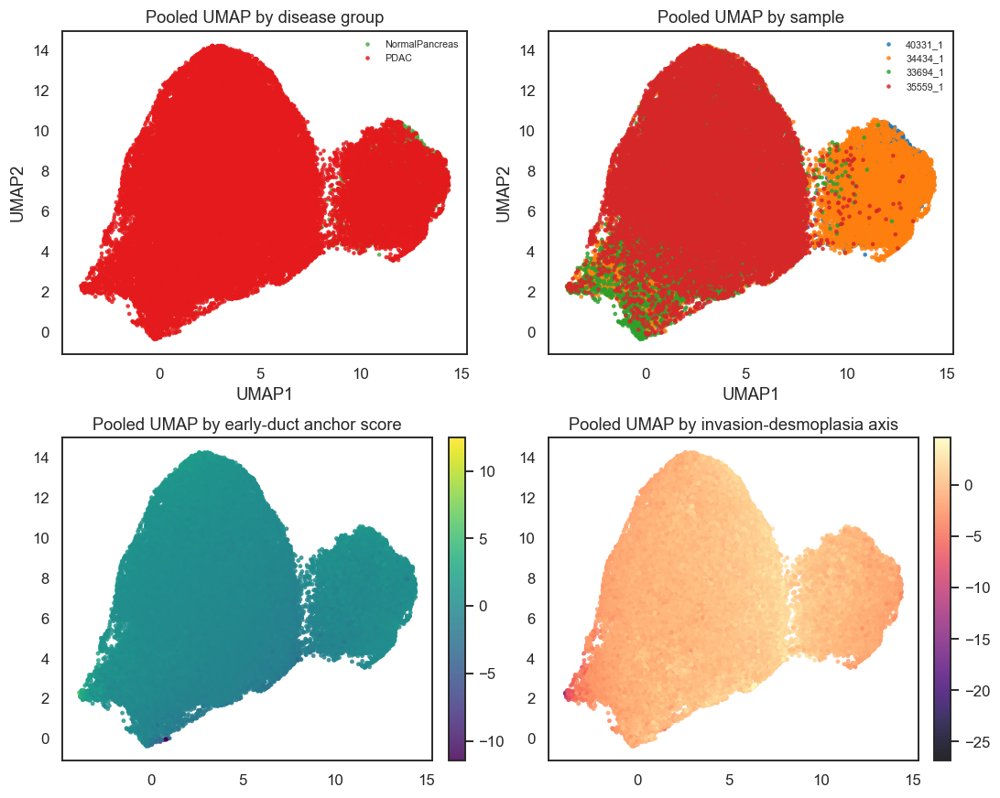

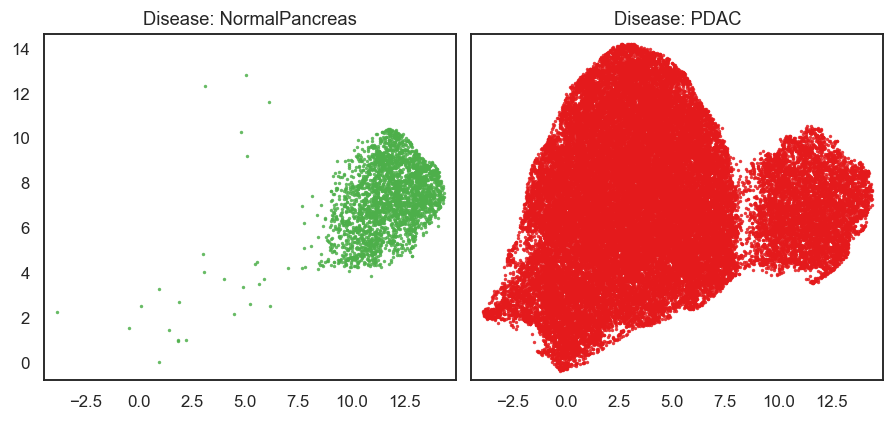

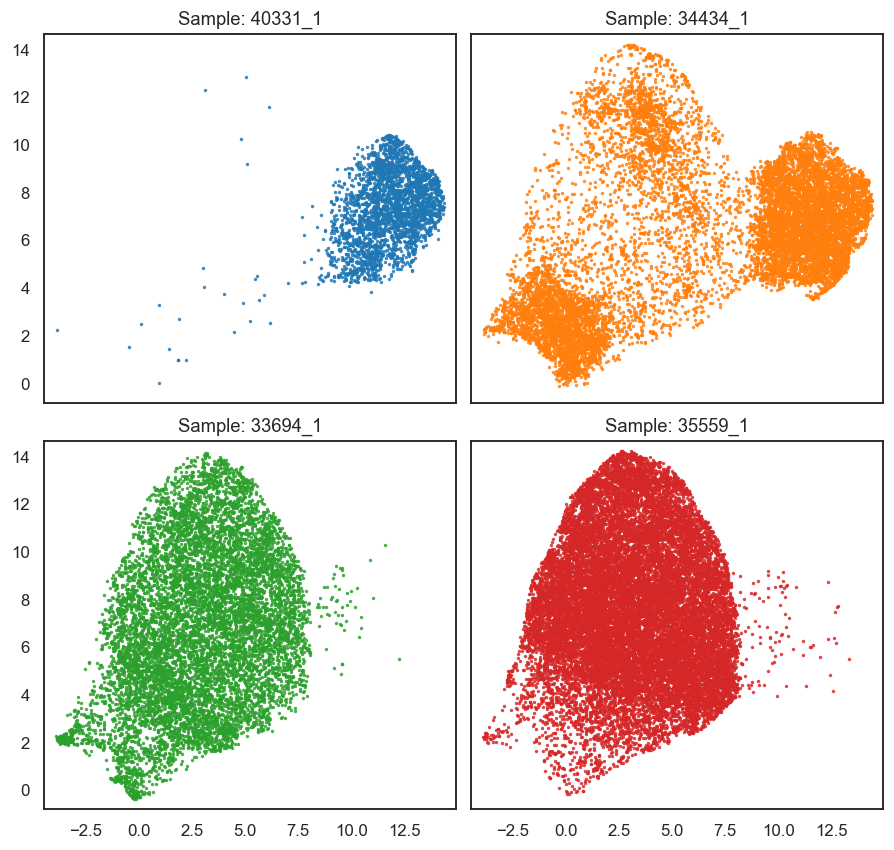

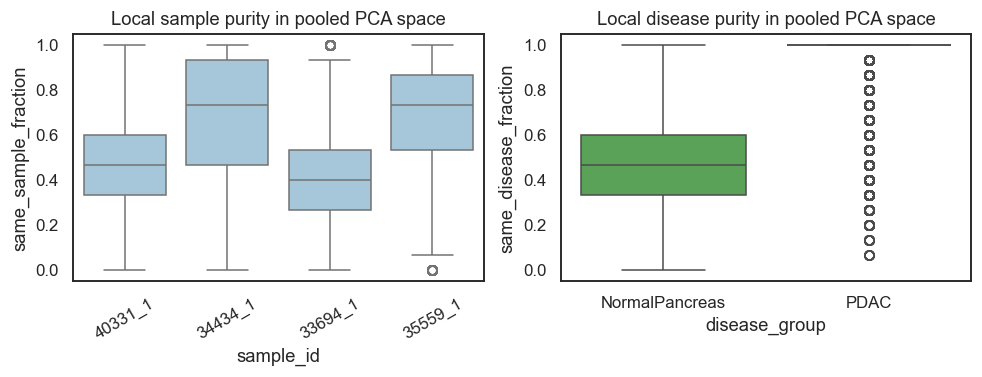

In [5]:

fig, axes = plt.subplots(2, 2, figsize=(10, 8))
axes = axes.ravel()
disease_palette = {"NormalPancreas": "#4daf4a", "PDAC": "#e41a1c"}
sample_palette = resolve_palette_mapping(embedding_df, "sample_id", palette="tab10")

plot_categorical_embedding(
    axes[0],
    embedding_df,
    x="UMAP1",
    y="UMAP2",
    color="disease_group",
    title="Pooled UMAP by disease group",
    palette=disease_palette,
)
plot_categorical_embedding(
    axes[1],
    embedding_df,
    x="UMAP1",
    y="UMAP2",
    color="sample_id",
    title="Pooled UMAP by sample",
    palette=sample_palette,
)
plot_continuous_embedding(
    axes[2],
    embedding_df,
    x="UMAP1",
    y="UMAP2",
    color="pdac_early_duct_anchor_score",
    title="Pooled UMAP by early-duct anchor score",
)
plot_continuous_embedding(
    axes[3],
    embedding_df,
    x="UMAP1",
    y="UMAP2",
    color="pdac_invasion_desmoplasia_axis",
    title="Pooled UMAP by invasion-desmoplasia axis",
    cmap="magma",
)

plt.tight_layout()
plt.show()

plot_categorical_embedding_facets(
    embedding_df,
    facet_col="disease_group",
    x="UMAP1",
    y="UMAP2",
    color="disease_group",
    palette=disease_palette,
    title_prefix="Disease: ",
    size=5,
    n_cols=2,
)

plot_categorical_embedding_facets(
    embedding_df,
    facet_col="sample_id",
    x="UMAP1",
    y="UMAP2",
    color="sample_id",
    palette=sample_palette,
    title_prefix="Sample: ",
    size=5,
    n_cols=2,
)

fig, axes = plt.subplots(1, 2, figsize=(9, 3.5))
sns.boxplot(
    data=embedding_df,
    x="sample_id",
    y="same_sample_fraction",
    color="#9ecae1",
    ax=axes[0],
)
axes[0].set_title("Local sample purity in pooled PCA space")
axes[0].tick_params(axis="x", rotation=30)
axes[0].grid(False)

sns.boxplot(
    data=embedding_df,
    x="disease_group",
    y="same_disease_fraction",
    hue="disease_group",
    palette={"NormalPancreas": "#4daf4a", "PDAC": "#e41a1c"},
    dodge=False,
    legend=False,
    ax=axes[1],
)
axes[1].set_title("Local disease purity in pooled PCA space")
axes[1].grid(False)

plt.tight_layout()
plt.show()



## Stage 3. Fit a pooled principal tree

Only interpret this tree if the pooled embedding above shows a biologically coherent continuum rather than four isolated sample islands.

The root is anchored on:

- all normal-pancreas ductal niches
- plus the most early-anchor-like PDAC niches


In [6]:

reduced_data = X_pool_pca_use
n_niches = reduced_data.shape[0]
num_nodes = min(100, max(40, int(np.ceil(np.sqrt(n_niches) * 2.5))))
num_nodes_simple = SIMPLIFIED_NUM_NODES

pg_tree_pooled = elpigraph.computeElasticPrincipalTree(
    X=reduced_data,
    NumNodes=num_nodes,
    Lambda=0.005,
    Mu=0.01,
)[0]

pg_tree_pooled_simple = elpigraph.computeElasticPrincipalTree(
    X=reduced_data,
    NumNodes=num_nodes_simple,
    Lambda=0.005,
    Mu=0.01,
)[0]

early_anchor = pd.to_numeric(embedding_df["pdac_early_duct_anchor_score"], errors="coerce")
normal_mask = embedding_df["disease_group"] == "NormalPancreas"
pdac_mask = embedding_df["disease_group"] == "PDAC"

if pdac_mask.any():
    pdac_quantile = early_anchor[pdac_mask].quantile(0.9)
    pdac_early_mask = pdac_mask & (early_anchor >= pdac_quantile)
else:
    pdac_early_mask = early_anchor == early_anchor.max()

root_mask = normal_mask | pdac_early_mask
if root_mask.fillna(False).sum() == 0:
    root_mask = early_anchor == early_anchor.max()

root_anchor = reduced_data[root_mask.to_numpy()].mean(axis=0)
source_node_pooled = int(
    np.argmin(np.sum((pg_tree_pooled["NodePositions"] - root_anchor) ** 2, axis=1))
)
source_node_pooled_simple = int(
    np.argmin(np.sum((pg_tree_pooled_simple["NodePositions"] - root_anchor) ** 2, axis=1))
)

elpigraph.utils.getPseudotime(
    X=reduced_data,
    PG=pg_tree_pooled,
    source=source_node_pooled,
    target=None,
)

elpigraph.utils.getPseudotime(
    X=reduced_data,
    PG=pg_tree_pooled_simple,
    source=source_node_pooled_simple,
    target=None,
)

pooled_result_df = embedding_df.copy()
pooled_result_df["pooled_pseudotime"] = pg_tree_pooled["pseudotime"]
pooled_result_df["pooled_node_id"] = pg_tree_pooled["projection"]["node_id"]
pooled_result_df["pooled_edge_id"] = pg_tree_pooled["projection"]["edge_id"]
pooled_result_df["simple_pseudotime"] = pg_tree_pooled_simple["pseudotime"]
pooled_result_df["simple_node_id"] = pg_tree_pooled_simple["projection"]["node_id"]
pooled_result_df["simple_edge_id"] = pg_tree_pooled_simple["projection"]["edge_id"]
(
    auto_trunk_path,
    auto_branch_paths,
    auto_subbranch_paths,
    auto_tree_inference_df,
    auto_branch_inference_df,
    auto_leaf_score_df,
) = infer_auto_simple_tree_branch_paths(
    pooled_result_df,
    pg_tree_pooled_simple,
    node_col="simple_node_id",
)
pooled_result_df, major_branch_order, branch_summary_df, branch_definition_df = assign_simple_tree_branches_from_paths(
    pooled_result_df,
    pg_tree=pg_tree_pooled_simple,
    trunk_path=auto_trunk_path,
    branch_paths=auto_branch_paths,
    subbranch_paths=auto_subbranch_paths,
    node_col="simple_node_id",
    edge_col="simple_edge_id",
    out_col="major_branch",
)
simple_tree_node_summary_df = summarize_tree_nodes(
    pooled_result_df,
    pg_tree_pooled_simple,
    root_node=auto_trunk_path[0],
    node_col="simple_node_id",
    branch_col="major_branch",
)

save_df(pooled_result_df, CACHE_DIR / "pooled_niche_result_df.pkl")

print("NumNodes (detailed tree):", num_nodes)
print("NumNodes (simplified tree):", num_nodes_simple)
print("Root niches:", int(root_mask.sum()))
print("Major branch order:", major_branch_order)
print("Detailed root node:", source_node_pooled)
print("Simplified root node:", source_node_pooled_simple)
print("Simplified first branching node:", int(pooled_result_df["first_branch_node"].iloc[0]))
display(auto_tree_inference_df)
display(auto_branch_inference_df)
display(auto_leaf_score_df.head(10))
display(branch_summary_df)
display(branch_definition_df)
simple_tree_node_summary_df.sort_values(["depth_from_root", "node_id"])


NumNodes (detailed tree): 100
NumNodes (simplified tree): 24
Root niches: 7270
Major branch order: ['trunk', 'branch 1', 'branch 1.a', 'branch 1.b', 'branch 1.c', 'branch 1.d', 'branch 9', 'branch 10', 'branch 12', 'branch 13', 'branch 15', 'branch 17', 'branch 19']
Detailed root node: 4
Simplified root node: 20
Simplified first branching node: 0


,hub_node,hub_degree,trunk_endpoint,trunk_path,n_branches
0,0,9,4,4-23-8-16-0,8


,label,entry_node,n_nodes,terminal_leaves,path,n_projected_niches
0,branch 1,1,8,"6,7,11,22",0-1,9990
1,branch 9,9,1,9,0-9,2654
2,branch 10,10,3,3,0-10-20-3,7425
3,branch 12,12,1,12,0-12,1792
4,branch 13,13,1,13,0-13,2499
5,branch 15,15,1,15,0-15,2376
6,branch 17,17,2,2,0-17-2,4498
7,branch 19,19,2,5,0-19-5,5431


,leaf_node,n_projected_niches,normal_fraction,early_anchor_mean
2,4,1782,0.462963,0.393120
0,2,1879,0.044705,-0.985213
8,12,1792,0.026786,-0.597229
3,5,2348,0.019165,-0.060970
6,9,2654,0.012434,-0.115240
1,3,2077,0.008666,0.787092
11,22,2109,0.008061,-0.483083
10,15,2376,0.002946,0.270496
4,6,364,0.002747,1.133742
7,11,1901,0.002630,0.067605


,major_branch,n_niches
5,branch 10,7646
12,trunk,7595
10,branch 19,5607
9,branch 17,4722
11,branch 9,2967
7,branch 13,2754
8,branch 15,2710
1,branch 1.a,2648
4,branch 1.d,2407
3,branch 1.c,2319


,label,level,path,nodes,first_branch_node,subbranches
0,trunk,trunk,4-23-8-16-0,"4,23,8,16,0",0,
1,branch 1,hub_branch,0-1,"1,6,7,11,14,18,21,22",0,branch 1.a: 1-21-14-6; branch 1.b: 1-18-7; bra...
2,branch 1.a,subbranch,1-21-14-6,"21,14,6",0,
3,branch 1.b,subbranch,1-18-7,"18,7",0,
4,branch 1.c,subbranch,1-11,11,0,
5,branch 1.d,subbranch,1-22,22,0,
6,branch 9,hub_branch,0-9,9,0,
7,branch 10,hub_branch,0-10-20-3,"10,3,20",0,
8,branch 12,hub_branch,0-12,12,0,
9,branch 13,hub_branch,0-13,13,0,


,node_id,parent,depth_from_root,degree,n_projected_niches,children,top_branch_labels
4,4,NaN,0,1,1782,23,{'trunk': 1782}
23,23,4.0,1,2,1716,8,{'trunk': 1716}
8,8,23.0,2,2,1870,16,{'trunk': 1870}
16,16,8.0,3,2,2118,0,{'trunk': 2118}
0,0,16.0,4,9,2423,"1,9,10,12,13,15,17,19","{'branch 12': 495, 'branch 15': 334, 'branch 9..."
1,1,0.0,5,5,1836,"11,18,21,22","{'branch 1': 451, 'branch 1.c': 418, 'branch 1..."
9,9,0.0,5,1,2654,,{'branch 9': 2654}
10,10,0.0,5,2,3051,20,{'branch 10': 3051}
12,12,0.0,5,1,1792,,{'branch 12': 1792}
13,13,0.0,5,1,2499,,{'branch 13': 2499}


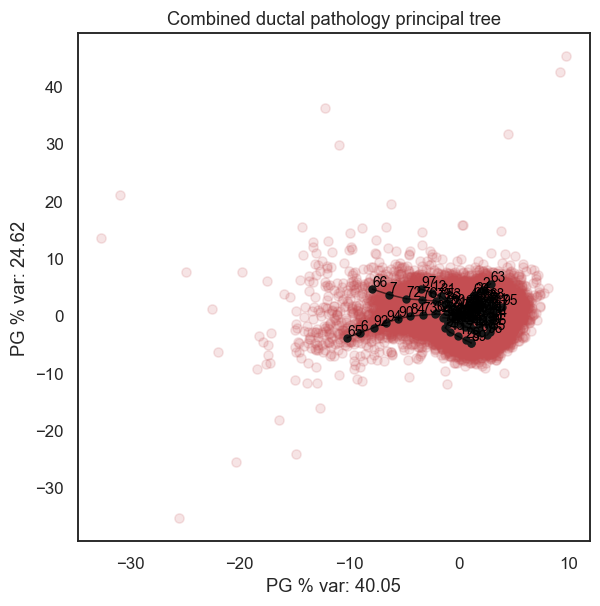

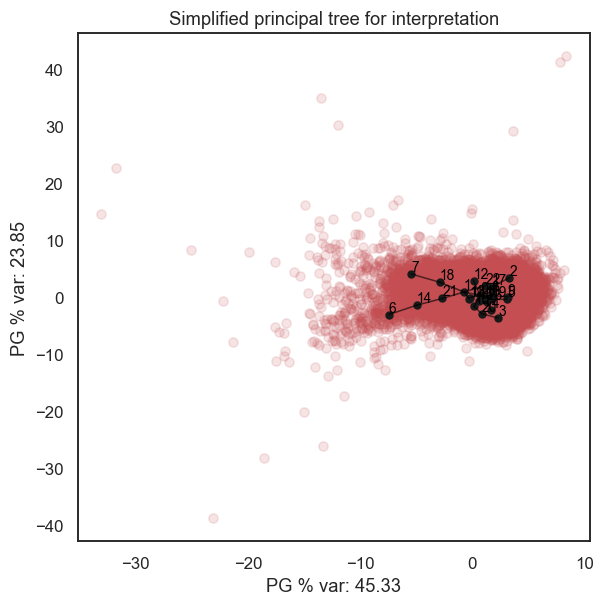

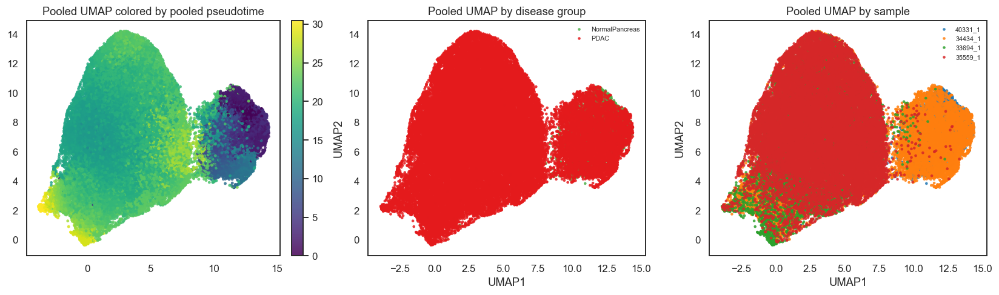

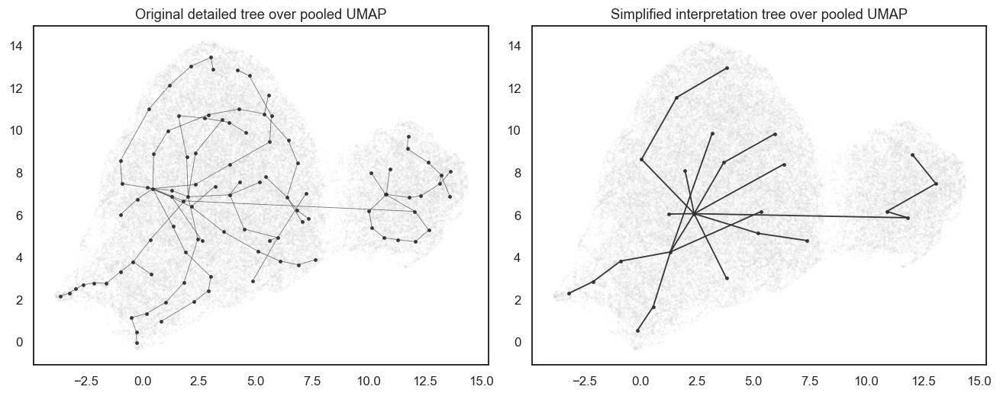

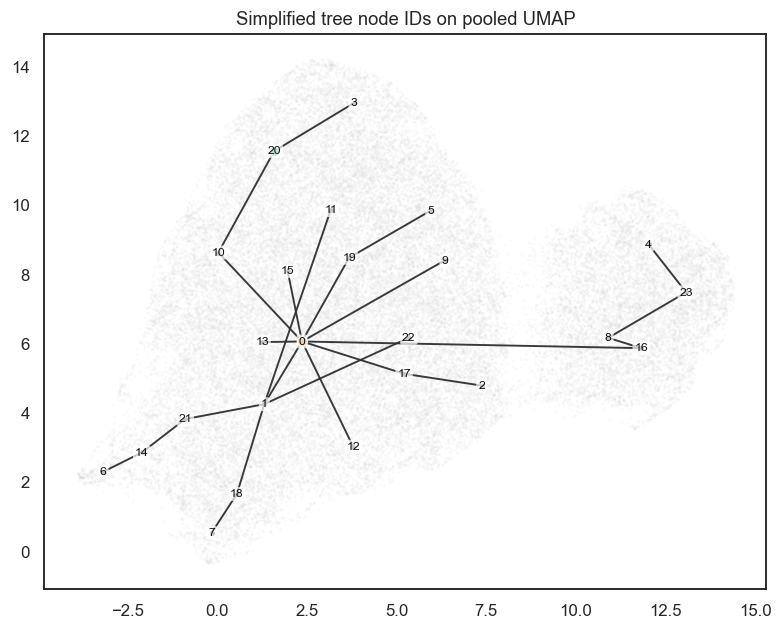

/var/folders/kg/btvhyzjs5fb7f_57bfqf24tr0000gn/T/ipykernel_6731/3393533462.py:337: UserWarning:

This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.



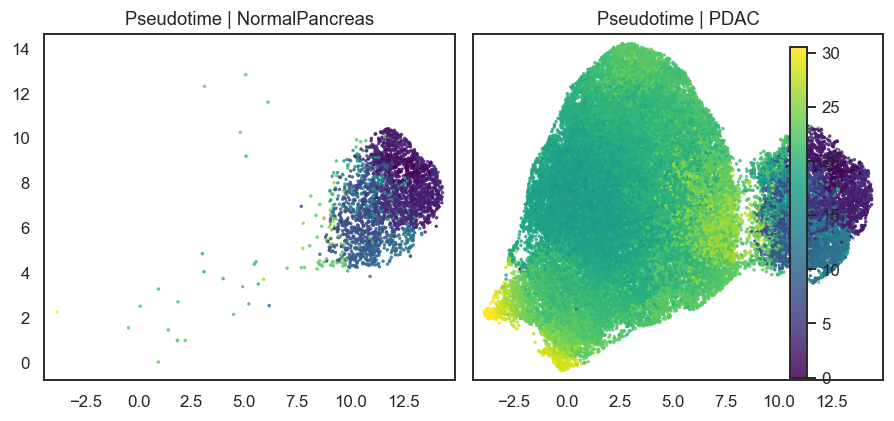

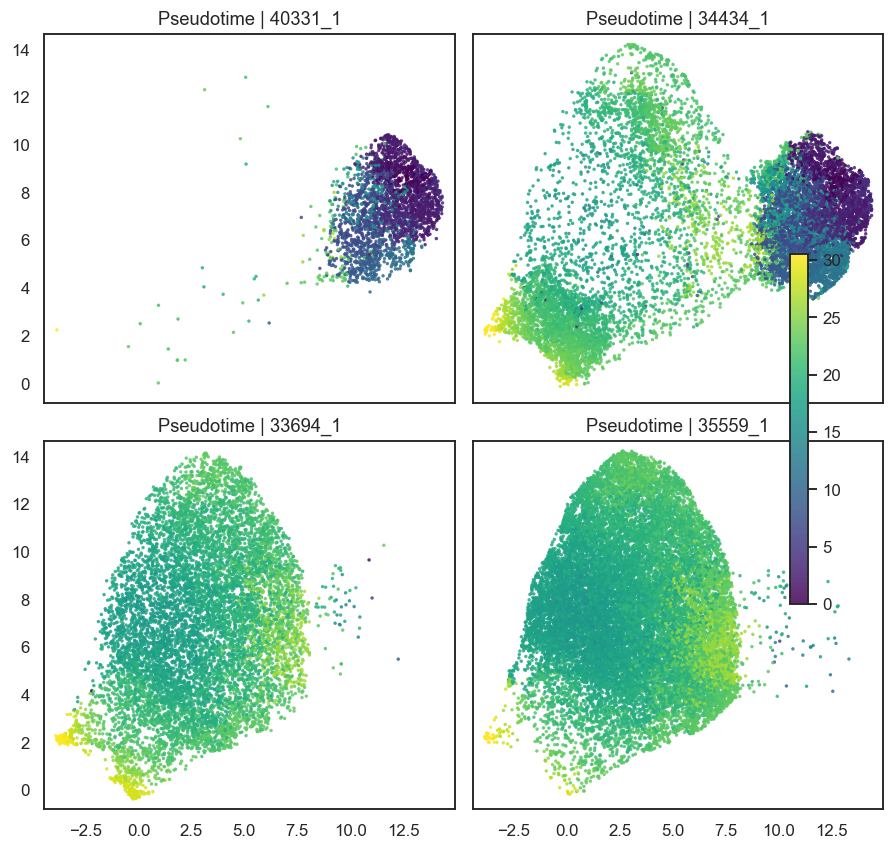

In [7]:

plt.figure(figsize=(6, 6))
elpigraph.plot.PlotPG(
    reduced_data,
    pg_tree_pooled,
    Do_PCA=True,
    show_text=True,
)
plt.title("Combined ductal pathology principal tree")
plt.grid(False)
plt.show()

plt.figure(figsize=(6, 6))
elpigraph.plot.PlotPG(
    reduced_data,
    pg_tree_pooled_simple,
    Do_PCA=True,
    show_text=True,
)
plt.title("Simplified principal tree for interpretation")
plt.grid(False)
plt.show()

fig, axes = plt.subplots(1, 3, figsize=(15, 4.5))

plot_continuous_embedding(
    axes[0],
    pooled_result_df,
    x="UMAP1",
    y="UMAP2",
    color="pooled_pseudotime",
    title="Pooled UMAP colored by pooled pseudotime",
)
plot_categorical_embedding(
    axes[1],
    pooled_result_df,
    x="UMAP1",
    y="UMAP2",
    color="disease_group",
    title="Pooled UMAP by disease group",
    palette=disease_palette,
)
plot_categorical_embedding(
    axes[2],
    pooled_result_df,
    x="UMAP1",
    y="UMAP2",
    color="sample_id",
    title="Pooled UMAP by sample",
    palette=sample_palette,
)

plt.tight_layout()
plt.show()

fig, axes = plt.subplots(1, 2, figsize=(12, 4.8))
plot_umap_tree_structure_overlay(
    axes[0],
    pooled_result_df,
    pg_tree_pooled,
    node_col="pooled_node_id",
    point_size=2.5,
    point_alpha=0.15,
    line_width=0.55,
    line_alpha=0.65,
)
axes[0].set_title("Original detailed tree over pooled UMAP")

plot_umap_tree_structure_overlay(
    axes[1],
    pooled_result_df,
    pg_tree_pooled_simple,
    node_col="simple_node_id",
    point_size=2.5,
    point_alpha=0.15,
    line_width=1.2,
    line_alpha=0.95,
)
axes[1].set_title("Simplified interpretation tree over pooled UMAP")

plt.tight_layout()
plt.show()

first_branch_node_simple = int(pooled_result_df["first_branch_node"].iloc[0])

fig, ax = plt.subplots(figsize=(7.2, 5.8))
simple_node_layout_df, simple_edge_layout_df = plot_umap_tree_structure_overlay(
    ax,
    pooled_result_df,
    pg_tree_pooled_simple,
    node_col="simple_node_id",
    point_size=2.5,
    point_alpha=0.12,
    line_width=1.25,
    line_alpha=0.95,
    show_node_labels=True,
    label_size=8,
    highlight_nodes={
        source_node_pooled_simple: "#1b9e77",
        first_branch_node_simple: "#d95f02",
    },
)
ax.set_title("Simplified tree node IDs on pooled UMAP")
plt.tight_layout()
plt.show()

simple_node_layout_df.sort_values("node_id").head()

plot_continuous_embedding_facets(
    pooled_result_df,
    facet_col="disease_group",
    x="UMAP1",
    y="UMAP2",
    color="pooled_pseudotime",
    cmap="viridis",
    title_prefix="Pseudotime | ",
    size=5,
    n_cols=2,
)

plot_continuous_embedding_facets(
    pooled_result_df,
    facet_col="sample_id",
    x="UMAP1",
    y="UMAP2",
    color="pooled_pseudotime",
    cmap="viridis",
    title_prefix="Pseudotime | ",
    size=5,
    n_cols=2,
)



### Optional: simplified-tree stability

This cell refits the simplified tree at several node counts and re-runs the automatic hub/trunk/branch inference.

It is intentionally controlled by `RUN_TREE_STABILITY_TEST` because each node count requires another ElPiGraph fit.


In [8]:

RUN_TREE_STABILITY_TEST = False
TREE_STABILITY_NUM_NODES = [18, 24, 30, 36]

if RUN_TREE_STABILITY_TEST:
    tree_stability_df, tree_branch_stability_df, tree_leaf_score_stability_df = run_simplified_tree_stability(
        X=reduced_data,
        embedding_df=embedding_df,
        root_anchor=root_anchor,
        num_nodes_list=TREE_STABILITY_NUM_NODES,
        lambda_value=0.005,
        mu_value=0.01,
    )
    save_df(tree_stability_df, CACHE_DIR / "simple_tree_stability_summary.pkl")
    save_df(tree_branch_stability_df, CACHE_DIR / "simple_tree_stability_branch_definitions.pkl")
    save_df(tree_leaf_score_stability_df, CACHE_DIR / "simple_tree_stability_leaf_scores.pkl")
    display(tree_stability_df)
    display(tree_branch_stability_df)
    display(tree_leaf_score_stability_df)
else:
    print("Set RUN_TREE_STABILITY_TEST = True to refit simplified trees at:", TREE_STABILITY_NUM_NODES)


Set RUN_TREE_STABILITY_TEST = True to refit simplified trees at: [18, 24, 30, 36]


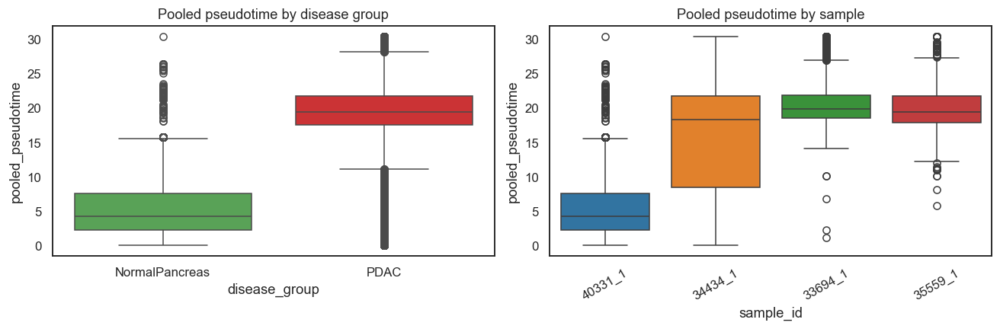

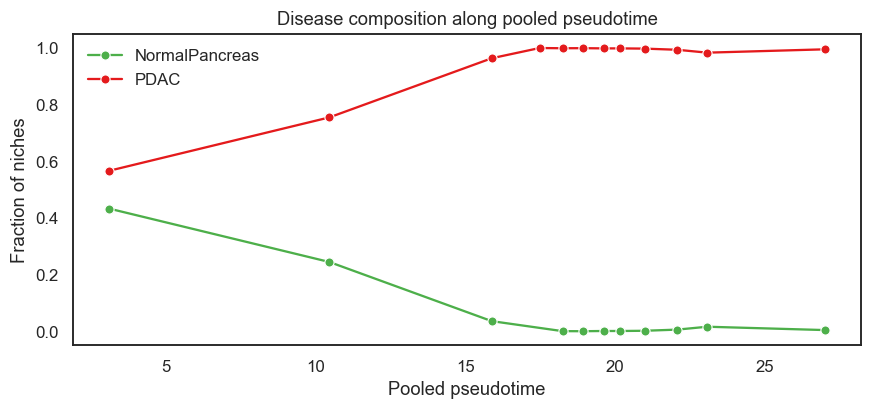

In [9]:

pooled_result_df["pt_bin"] = pd.qcut(
    pooled_result_df["pooled_pseudotime"],
    q=min(12, pooled_result_df["pooled_pseudotime"].nunique()),
    duplicates="drop",
)

bin_comp_df = (
    pooled_result_df.groupby(["pt_bin", "disease_group"], observed=True)
    .size()
    .rename("n")
    .reset_index()
)
bin_comp_df["fraction"] = (
    bin_comp_df["n"] /
    bin_comp_df.groupby("pt_bin", observed=True)["n"].transform("sum")
)
bin_comp_df["pt_bin_center"] = bin_comp_df["pt_bin"].apply(lambda x: x.mid)

fig, axes = plt.subplots(1, 2, figsize=(12, 4))

sns.boxplot(
    data=pooled_result_df,
    x="disease_group",
    y="pooled_pseudotime",
    hue="disease_group",
    palette={"NormalPancreas": "#4daf4a", "PDAC": "#e41a1c"},
    dodge=False,
    legend=False,
    ax=axes[0],
)
axes[0].set_title("Pooled pseudotime by disease group")
axes[0].grid(False)

sns.boxplot(
    data=pooled_result_df,
    x="sample_id",
    y="pooled_pseudotime",
    hue="sample_id",
    palette="tab10",
    dodge=False,
    legend=False,
    ax=axes[1],
)
axes[1].set_title("Pooled pseudotime by sample")
axes[1].tick_params(axis="x", rotation=30)
axes[1].grid(False)

plt.tight_layout()
plt.show()

plt.figure(figsize=(8, 3.8))
sns.lineplot(
    data=bin_comp_df.sort_values("pt_bin_center"),
    x="pt_bin_center",
    y="fraction",
    hue="disease_group",
    marker="o",
    palette={"NormalPancreas": "#4daf4a", "PDAC": "#e41a1c"},
)
plt.ylabel("Fraction of niches")
plt.xlabel("Pooled pseudotime")
plt.title("Disease composition along pooled pseudotime")
plt.grid(False)
plt.legend(frameon=False)
plt.tight_layout()
plt.show()


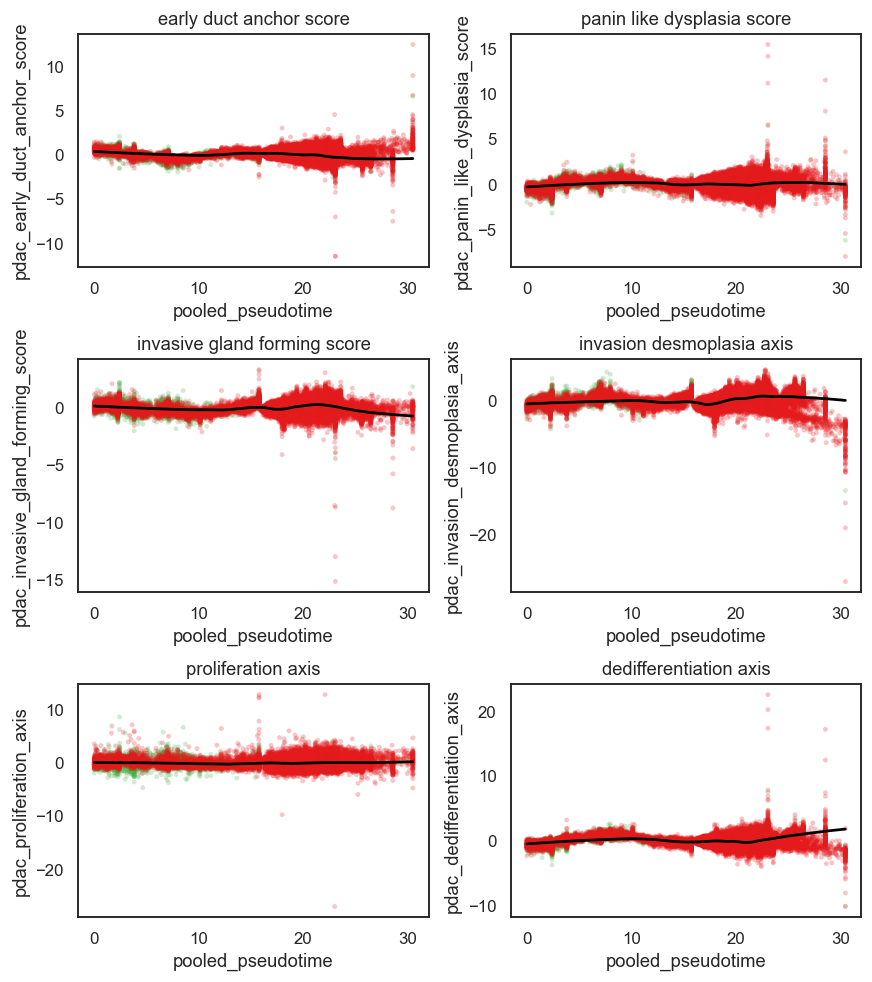

In [10]:

trend_cols = [
    "pdac_early_duct_anchor_score",
    "pdac_panin_like_dysplasia_score",
    "pdac_invasive_gland_forming_score",
    "pdac_invasion_desmoplasia_axis",
    "pdac_proliferation_axis",
    "pdac_dedifferentiation_axis",
]

n_cols = 2
n_rows = int(np.ceil(len(trend_cols) / n_cols))
fig, axes = plt.subplots(n_rows, n_cols, figsize=(8, 3.0 * n_rows))
axes = np.array(axes).reshape(-1)

for ax, col in zip(axes, trend_cols):
    sns.scatterplot(
        data=pooled_result_df,
        x="pooled_pseudotime",
        y=col,
        hue="disease_group",
        palette={"NormalPancreas": "#4daf4a", "PDAC": "#e41a1c"},
        s=10,
        alpha=0.25,
        linewidth=0,
        legend=False,
        ax=ax,
    )
    smooth = lowess_smooth(
        pooled_result_df["pooled_pseudotime"],
        pooled_result_df[col],
        frac=0.28,
    )
    if smooth is not None:
        ax.plot(smooth[:, 0], smooth[:, 1], color="black", linewidth=1.8)
    ax.set_title(col.replace("pdac_", "").replace("_", " "))
    ax.grid(False)

for ax in axes[len(trend_cols):]:
    ax.axis("off")

plt.tight_layout()
plt.show()



## Stage 4. Branch-aware pooled views

These views are useful when the combined trajectory is branching rather than close to linear.

They help answer:

- which major branches dominate different samples?
- whether normal pancreas sits mainly on one trunk while PDAC occupies multiple branches
- whether specific branches are associated with distinct pathology-module profiles

Important note:

- the fitted tree lives in pooled PCA space, not in UMAP space
- so apparent “jumps” on the UMAP can reflect UMAP distortion as much as true biological discontinuity
- for interpretation, we therefore keep the original detailed tree for pseudotime, but use the simplified tree plus structural branch labels for visualization
- here `trunk` means the path from the rooted start to the first branching node of the simplified tree
- `branch 1`, `branch 2`, ... are the first-generation branches that emerge from that split


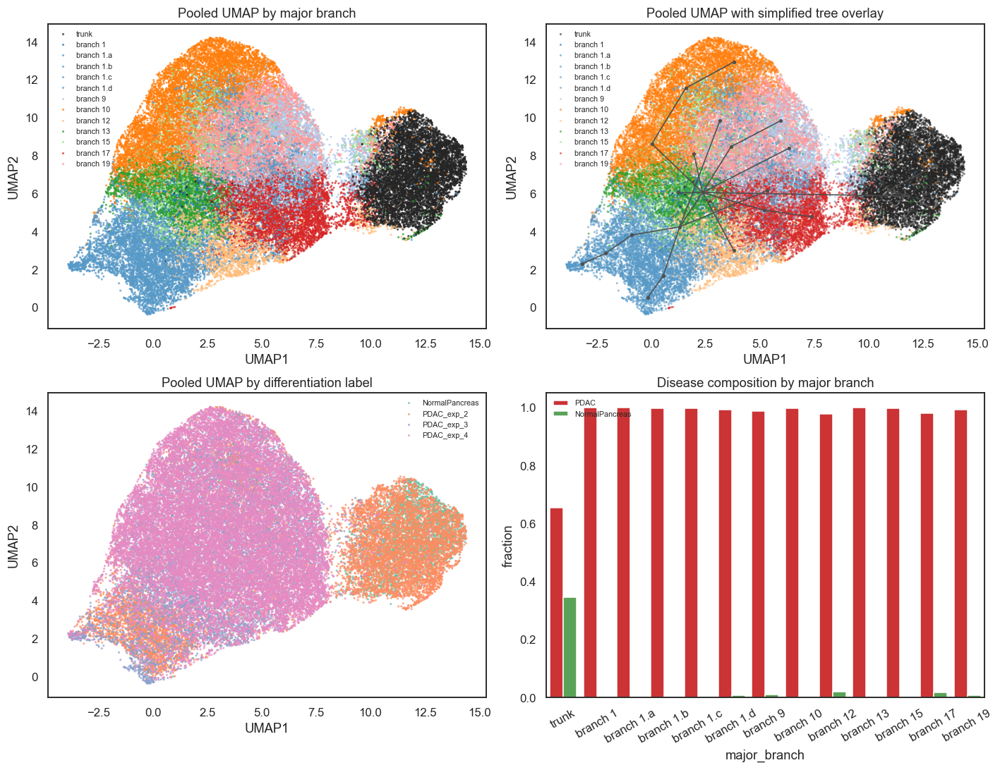

/var/folders/kg/btvhyzjs5fb7f_57bfqf24tr0000gn/T/ipykernel_6731/1365177547.py:93: UserWarning:

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.



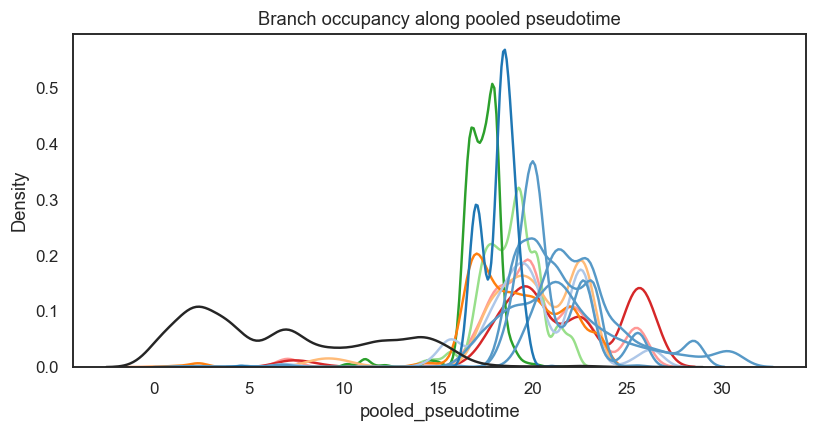

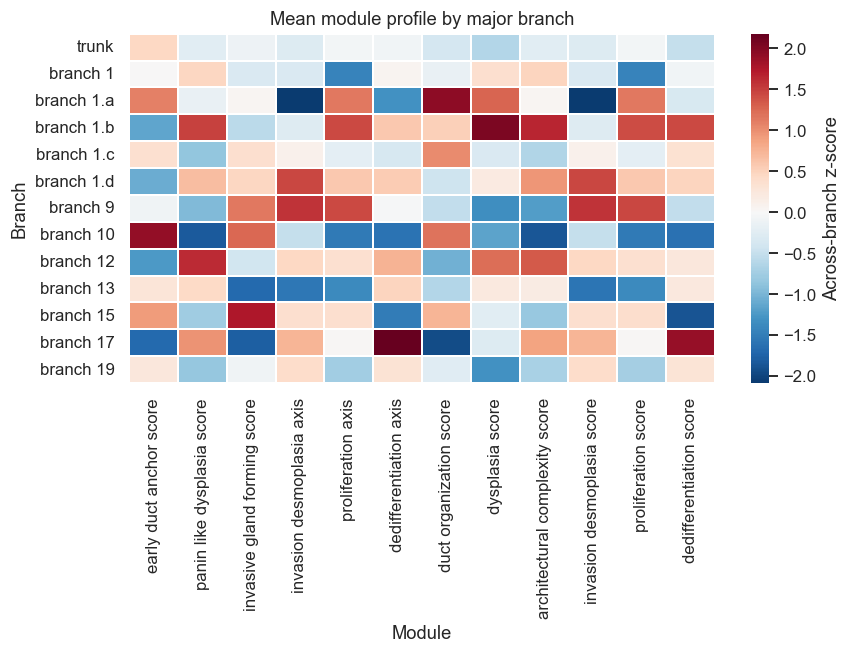

,node_id,parent,depth_from_root,degree,n_projected_niches,children,top_branch_labels
4,4,NaN,0,1,1782,23,{'trunk': 1782}
23,23,4.0,1,2,1716,8,{'trunk': 1716}
8,8,23.0,2,2,1870,16,{'trunk': 1870}
16,16,8.0,3,2,2118,0,{'trunk': 2118}
0,0,16.0,4,9,2423,"1,9,10,12,13,15,17,19","{'branch 12': 495, 'branch 15': 334, 'branch 9..."
1,1,0.0,5,5,1836,"11,18,21,22","{'branch 1': 451, 'branch 1.c': 418, 'branch 1..."
9,9,0.0,5,1,2654,,{'branch 9': 2654}
10,10,0.0,5,2,3051,20,{'branch 10': 3051}
12,12,0.0,5,1,1792,,{'branch 12': 1792}
13,13,0.0,5,1,2499,,{'branch 13': 2499}


In [11]:

branch_palette = branch_palette_from_df(pooled_result_df, branch_col="major_branch")

fig, axes = plt.subplots(2, 2, figsize=(13, 10))
axes = np.array(axes).reshape(-1)

sns.scatterplot(
    data=pooled_result_df,
    x="UMAP1",
    y="UMAP2",
    hue="major_branch",
    hue_order=major_branch_order,
    palette=branch_palette,
    s=4,
    linewidth=0,
    alpha=0.75,
    ax=axes[0],
)
axes[0].set_title("Pooled UMAP by major branch")
axes[0].grid(False)
axes[0].legend(frameon=False, fontsize=7, loc="best")

plot_umap_tree_overlay(
    axes[1],
    pooled_result_df,
    pg_tree_pooled_simple,
    node_col="simple_node_id",
    color_col="major_branch",
    palette=branch_palette,
    hue_order=major_branch_order,
    point_size=4,
    alpha=0.60,
)
axes[1].set_title("Pooled UMAP with simplified tree overlay")
axes[1].grid(False)
axes[1].legend(frameon=False, fontsize=7, loc="best")

branch_comp_df = (
    pooled_result_df.groupby(["major_branch", "disease_group"], observed=True)
    .size()
    .rename("n")
    .reset_index()
)
branch_comp_df["fraction"] = (
    branch_comp_df["n"] /
    branch_comp_df.groupby("major_branch", observed=True)["n"].transform("sum")
)

sns.barplot(
    data=branch_comp_df,
    x="major_branch",
    y="fraction",
    hue="disease_group",
    order=major_branch_order,
    palette={"NormalPancreas": "#4daf4a", "PDAC": "#e41a1c"},
    ax=axes[3],
)
axes[3].set_title("Disease composition by major branch")
axes[3].tick_params(axis="x", rotation=30)
axes[3].grid(False)
axes[3].legend(frameon=False, fontsize=7, loc="best")

sns.scatterplot(
    data=pooled_result_df,
    x="UMAP1",
    y="UMAP2",
    hue="differentiation_label",
    palette="Set2",
    s=4,
    linewidth=0,
    alpha=0.75,
    ax=axes[2],
)
axes[2].set_title("Pooled UMAP by differentiation label")
axes[2].grid(False)
axes[2].legend(frameon=False, fontsize=7, loc="best")

plt.tight_layout()
plt.show()

plt.figure(figsize=(7.5, 4.0))
sns.kdeplot(
    data=pooled_result_df[pooled_result_df["major_branch"] != "unassigned"],
    x="pooled_pseudotime",
    hue="major_branch",
    hue_order=[x for x in major_branch_order if x != "unassigned"],
    palette=branch_palette,
    common_norm=False,
    fill=False,
    linewidth=1.6,
)
plt.title("Branch occupancy along pooled pseudotime")
plt.grid(False)
plt.legend(frameon=False, fontsize=7, loc="best")
plt.tight_layout()
plt.show()

branch_module_mean_df = plot_branch_module_heatmap(
    pooled_result_df,
    module_cols=MODULE_COLS,
    group_col="major_branch",
    group_order=major_branch_order,
    top_n=TOP_BRANCH_GROUPS_FOR_SUMMARY,
)
branch_module_mean_df.head()

branch_summary_df

branch_definition_df

simple_tree_node_summary_df.sort_values(["depth_from_root", "node_id"])



## Stage 5. Project the pooled trajectory back into tissue space

This is often the most persuasive “application value” visualization:

- the pooled trajectory is not just an embedding artifact
- it maps back to real spatial ductal structures in each tissue section


In [12]:

spatial_cell_tables = {}
for sample_id in SPATIAL_VIS_SAMPLE_IDS:
    cfg = get_sample_cfg(sample_id)
    spatial_cell_tables[sample_id] = build_sample_spatial_cell_df(
        cfg,
        pooled_result_df,
        force=False,
    )
    print(
        sample_id,
        spatial_cell_tables[sample_id].shape,
        "n niche-assigned cells =",
        int(spatial_cell_tables[sample_id]["has_pooled_niche"].sum()),
    )


40331_1 (1443965, 22) n niche-assigned cells = 42212


/Users/shihongwu/anaconda3/envs/spatioev_env/lib/python3.11/site-packages/anndata/_core/aligned_df.py:68: ImplicitModificationWarning:

Transforming to str index.



34434_1 (1763634, 22) n niche-assigned cells = 385675


/Users/shihongwu/anaconda3/envs/spatioev_env/lib/python3.11/site-packages/anndata/_core/aligned_df.py:68: ImplicitModificationWarning:

Transforming to str index.



33694_1 (2919250, 22) n niche-assigned cells = 379314


/Users/shihongwu/anaconda3/envs/spatioev_env/lib/python3.11/site-packages/anndata/_core/aligned_df.py:68: ImplicitModificationWarning:

Transforming to str index.



35559_1 (1994937, 22) n niche-assigned cells = 430869


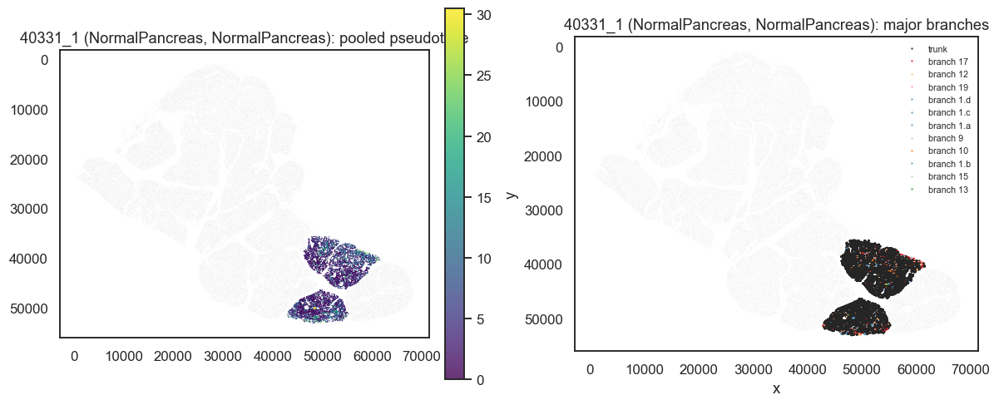

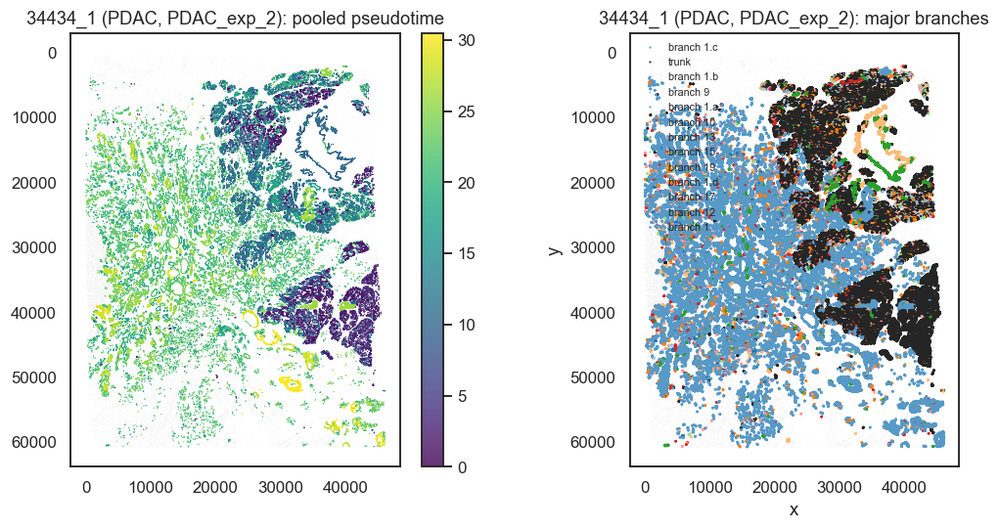

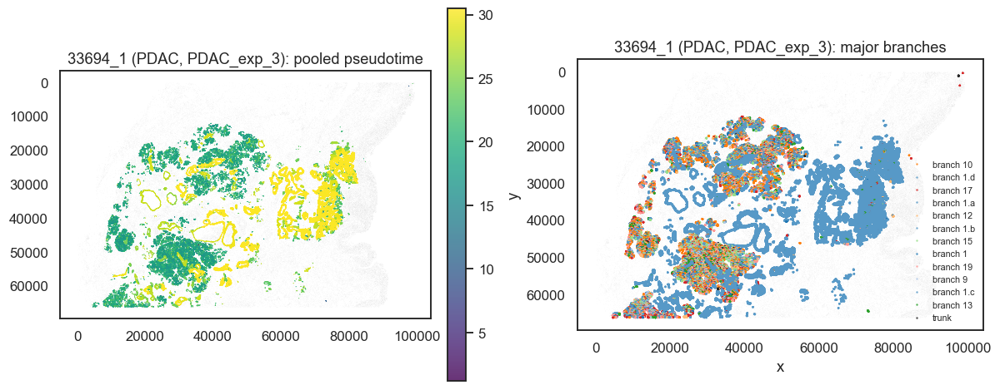

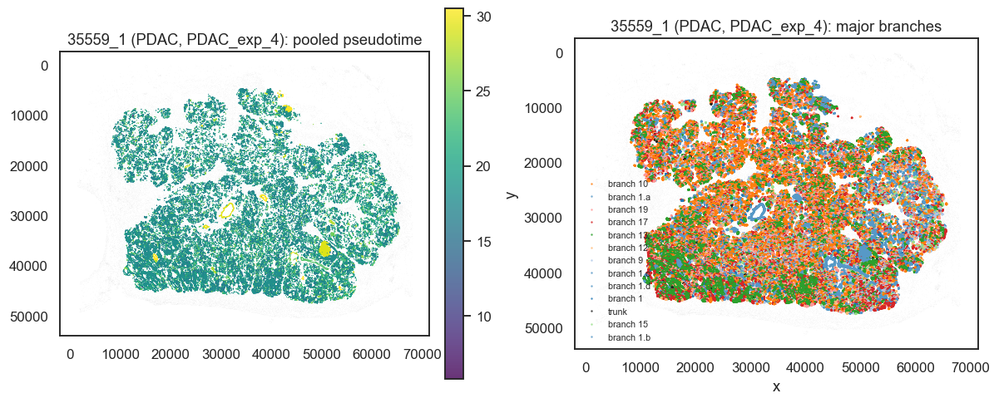

In [13]:

for sample_id in SPATIAL_VIS_SAMPLE_IDS:
    sample_df = spatial_cell_tables[sample_id]
    title_prefix = (
        f"{sample_id} "
        f"({sample_df['disease_group'].iloc[0]}, {sample_df['differentiation_label'].iloc[0]})"
    )
    plot_spatial_sample_views(
        sample_df,
        title_prefix=title_prefix,
        background_max=140000,
        point_size=0.08,
        niche_point_size=0.18,
    )



## Stage 6. Representative niche examples

These panels highlight concrete ductal niches sampled from different parts of the pooled trajectory.

They are useful for slides/talks because they turn the abstract pooled tree back into recognizable tissue structures.


In [14]:

representative_niches_df = select_representative_niches(
    pooled_result_df,
    sample_id=REPRESENTATIVE_SAMPLE_ID,
    group_col="major_branch",
    group_order=[x for x in major_branch_order if x not in {"trunk", "other", "unassigned"}],
    quantiles=REPRESENTATIVE_NICHE_QUANTILES,
    top_n_groups=TOP_BRANCH_GROUPS_FOR_SUMMARY,
)

representative_niches_df[
    [
        "sample_id",
        "disease_group",
        "major_branch",
        "simple_edge_id",
        "pooled_edge_id",
        "pooled_pseudotime",
        "pdac_early_duct_anchor_score",
        "pdac_invasion_desmoplasia_axis",
        "pdac_dedifferentiation_axis",
        "quantile_label",
        NICHIE_KEY,
    ]
].head(12)


,sample_id,disease_group,major_branch,simple_edge_id,pooled_edge_id,pooled_pseudotime,pdac_early_duct_anchor_score,pdac_invasion_desmoplasia_axis,pdac_dedifferentiation_axis,quantile_label,pancreatic ductal epithelium_mask_component
0,33694_1,PDAC,branch 1,0,28,17.086374,0.245671,-0.318433,0.134121,q0.15,global__component_475
1,33694_1,PDAC,branch 1,0,5,18.388563,0.073820,-0.163281,0.258247,q0.50,global__component_6575
2,33694_1,PDAC,branch 1,0,5,18.945638,-0.181680,0.074708,0.351542,q0.85,global__component_157
3,33694_1,PDAC,branch 1.a,18,45,18.585667,0.498931,-0.942310,-0.958979,q0.15,global__component_2175
4,33694_1,PDAC,branch 1.a,18,64,21.289363,-0.099427,-1.289223,-0.345663,q0.50,global__component_8635
5,33694_1,PDAC,branch 1.a,6,90,28.140517,0.187837,-2.616757,-0.626692,q0.85,global__component_3252
6,33694_1,PDAC,branch 1.b,12,82,20.722540,-0.478067,0.446318,0.822964,q0.15,global__component_424
7,33694_1,PDAC,branch 1.b,13,96,23.002237,-0.211246,0.338019,-0.216335,q0.50,global__component_6800
8,33694_1,PDAC,branch 1.b,13,56,28.572180,0.184885,-1.618199,-1.450588,q0.85,global__component_13169
9,33694_1,PDAC,branch 1.c,3,5,18.834349,0.088986,-0.224576,0.385837,q0.15,global__component_5666


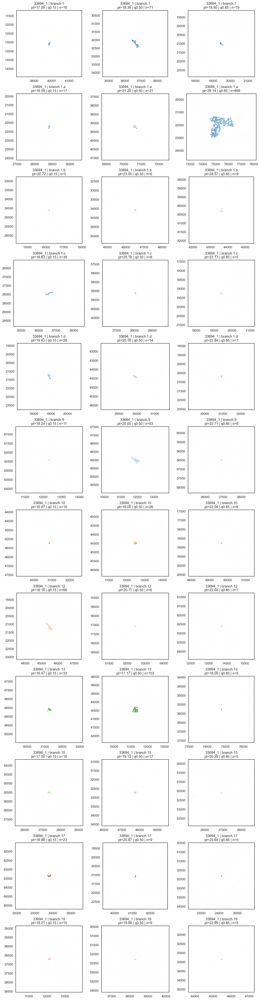

In [15]:

rep_sample_df = spatial_cell_tables.get(REPRESENTATIVE_SAMPLE_ID)
if rep_sample_df is None:
    rep_sample_df = build_sample_spatial_cell_df(
        get_sample_cfg(REPRESENTATIVE_SAMPLE_ID),
        pooled_result_df,
        force=False,
    )

plot_representative_niche_panels(
    rep_sample_df,
    representative_niches_df,
    background_max=100000,
    n_cols=3,
)



## Stage 7. Branch-specific microenvironment context

This stage asks whether different pooled branches carry different stromal and immune surroundings.

That is often where the pooled trajectory becomes most biologically persuasive:

- some branches may remain duct-rich and relatively organized
- others may become fibroblast-heavy or immune-enriched
- fibroblast activation markers may separate branch programs even when the epithelial continuum looks similar


In [16]:

branch_context_cols = [c for c in BRANCH_CONTEXT_FEATURES + BRANCH_FIBRO_MARKER_FEATURES if c in pooled_pathology_df.columns]

pooled_context_df = pooled_result_df.merge(
    pooled_pathology_df[[NICHIE_KEY, "image_id"] + branch_context_cols].drop_duplicates(subset=[NICHIE_KEY, "image_id"]),
    on=[NICHIE_KEY, "image_id"],
    how="left",
)

top_branch_labels = [
    x
    for x in major_branch_order
    if x not in {"other", "unassigned"}
]
if TOP_BRANCHES_FOR_CONTEXT_TRENDS is not None:
    top_branch_labels = top_branch_labels[:TOP_BRANCHES_FOR_CONTEXT_TRENDS]

print("Branches for context trends:", top_branch_labels)
print("Context columns available:", branch_context_cols)
pooled_context_df.shape


Branches for context trends: ['trunk', 'branch 1', 'branch 1.a', 'branch 1.b', 'branch 1.c', 'branch 1.d', 'branch 9', 'branch 10', 'branch 12', 'branch 13', 'branch 15', 'branch 17', 'branch 19']
Context columns available: ['surround_prop__pancreatic_ductal_epithelium', 'surround_prop__Fibroblasts', 'surround_prop__T_cells', 'surround_prop__B_lineage', 'surround_prop__Endothelial_cells', 'surround_prop__Vimentin_only_mesenchyme', 'surround_prop__pancreatic_acinar_epithelium', 'surround__Fibroblasts__FAP_expr_z__mean', 'surround__Fibroblasts__aSMA_expr_z__mean', 'surround__Fibroblasts__PDPN_expr_z__mean', 'surround__Fibroblasts__Thy1_expr_z__mean']


(46574, 50)

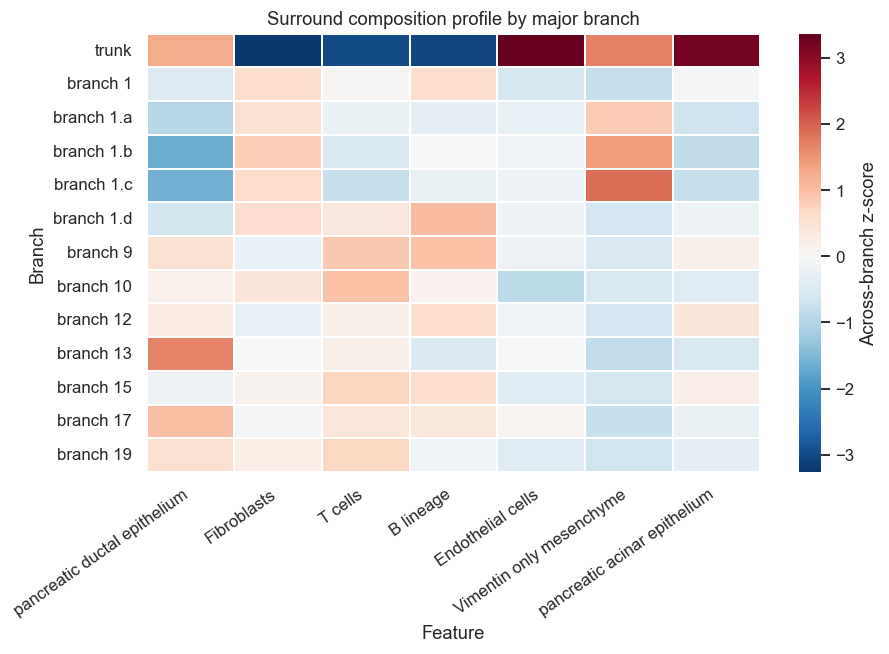

,surround_prop__pancreatic_ductal_epithelium,surround_prop__Fibroblasts,surround_prop__T_cells,surround_prop__B_lineage,surround_prop__Endothelial_cells,surround_prop__Vimentin_only_mesenchyme,surround_prop__pancreatic_acinar_epithelium
major_branch,,,,,,,
trunk,0.348331,0.053068,0.024021,0.006630,0.095671,0.119148,0.324764
branch 1,0.282148,0.406486,0.059514,0.032114,0.063773,0.034760,0.077385
branch 1.a,0.262219,0.399190,0.056367,0.025693,0.066016,0.089516,0.030990
branch 1.b,0.233191,0.427961,0.052635,0.027866,0.067265,0.109722,0.018857
branch 1.c,0.234957,0.413060,0.050091,0.026173,0.066974,0.124892,0.024658


In [17]:

branch_context_mean_df = plot_branch_feature_heatmap(
    pooled_context_df,
    feature_cols=BRANCH_CONTEXT_FEATURES,
    group_col="major_branch",
    group_order=major_branch_order,
    top_n=TOP_BRANCH_GROUPS_FOR_SUMMARY,
    figsize=(8.5, 4.0),
    title="Surround composition profile by major branch",
    cbar_label="Across-branch z-score",
)
branch_context_mean_df.head()


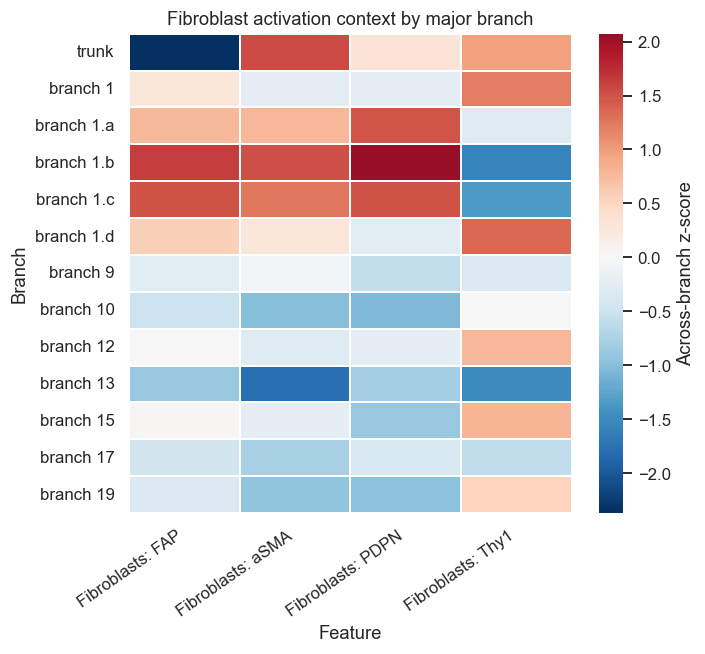

,surround__Fibroblasts__FAP_expr_z__mean,surround__Fibroblasts__aSMA_expr_z__mean,surround__Fibroblasts__PDPN_expr_z__mean,surround__Fibroblasts__Thy1_expr_z__mean
major_branch,,,,
trunk,0.082522,0.653300,0.083448,0.452040
branch 1,0.431413,0.281102,-0.004988,0.470598
branch 1.a,0.492888,0.495481,0.269627,0.357347
branch 1.b,0.604490,0.651569,0.363825,0.260488
branch 1.c,0.590059,0.595037,0.271706,0.277811


In [18]:

branch_fibro_mean_df = plot_branch_feature_heatmap(
    pooled_context_df,
    feature_cols=BRANCH_FIBRO_MARKER_FEATURES,
    group_col="major_branch",
    group_order=major_branch_order,
    top_n=TOP_BRANCH_GROUPS_FOR_SUMMARY,
    figsize=(6.5, 3.6),
    title="Fibroblast activation context by major branch",
    cbar_label="Across-branch z-score",
)
branch_fibro_mean_df.head()


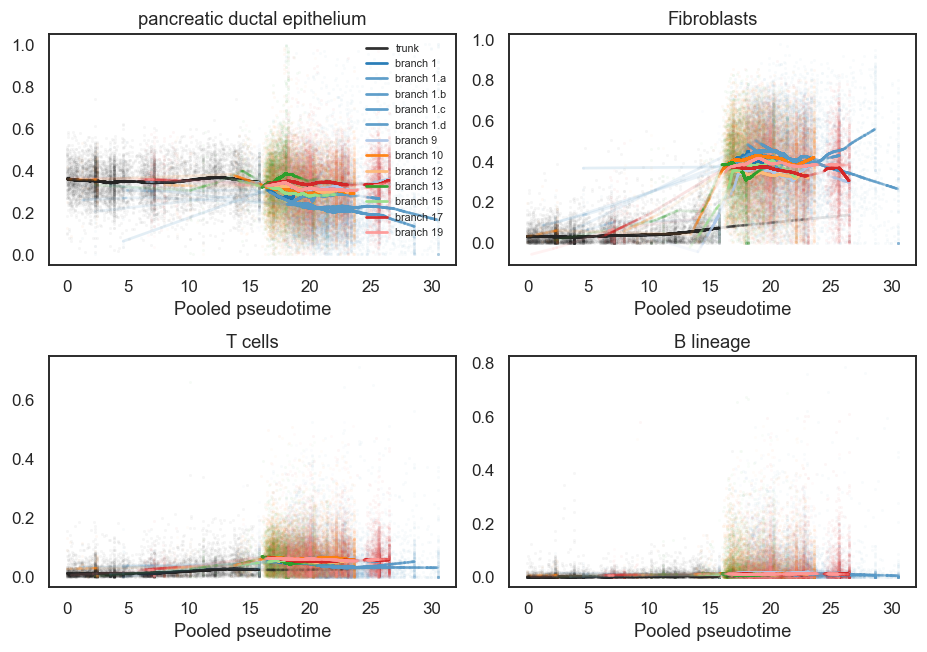

In [19]:

plot_branch_trend_panels(
    pooled_context_df,
    feature_cols=BRANCH_CONTEXT_TREND_FEATURES,
    branch_order=top_branch_labels,
    branch_palette=branch_palette,
    n_cols=2,
    figsize_scale=3.0,
    point_alpha=0.04,
    point_size=4,
    line_width=1.8,
    lowess_frac=0.28,
    min_points=60,
)


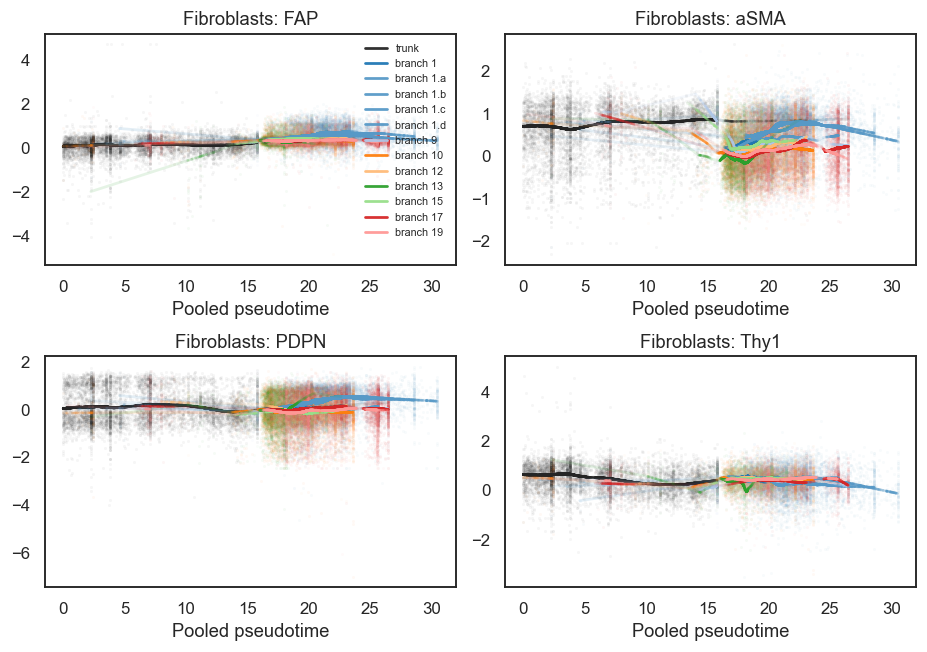

In [20]:

plot_branch_trend_panels(
    pooled_context_df,
    feature_cols=BRANCH_FIBRO_MARKER_FEATURES,
    branch_order=top_branch_labels,
    branch_palette=branch_palette,
    n_cols=2,
    figsize_scale=3.0,
    point_alpha=0.04,
    point_size=4,
    line_width=1.8,
    lowess_frac=0.28,
    min_points=60,
)



## Stage 8. Epithelial-intrinsic trajectory and PanIN-like validation

This is the clean biological sensitivity analysis.

The pooled tree above is a **contextual ductal niche trajectory** because stromal and surround features help define the feature space.

Here we rebuild a second tree from epithelial-intrinsic features only:

- duct/gland organization
- epithelial morphology and nuclear/cytoplasmic features
- CK19 / NaKATPase / Ki67 / Vimentin summaries
- texture and polarity features
- ductal graph geometry/topology

Surround proportions and fibroblast/immune marker summaries are excluded from this tree, then tested afterward.


In [21]:

panin_validation_score_df, panin_validation_feature_df = score_panin_morphology_validation(
    pooled_pathology_df,
    min_features=2,
)
pooled_pathology_panin_df = pd.concat(
    [
        pooled_pathology_df.reset_index(drop=True),
        panin_validation_score_df.reset_index(drop=True),
    ],
    axis=1,
)

save_df(pooled_pathology_panin_df, CACHE_DIR / "pooled_pathology_with_panin_validation_scores.pkl")
save_df(panin_validation_feature_df, CACHE_DIR / "panin_validation_resolved_features.pkl")

score_summary_df = (
    pooled_pathology_panin_df.groupby(["disease_group", "sample_id"], observed=True)[PANIN_VALIDATION_SCORE_COLS]
    .mean()
    .reset_index()
)

display(panin_validation_feature_df)
score_summary_df


,score,feature,sign
0,panin_validation__normal_duct_like_score,pdac_duct_organization_score,1.0
1,panin_validation__normal_duct_like_score,pdac_dysplasia_score,-1.0
2,panin_validation__normal_duct_like_score,pdac_architectural_complexity_score,-1.0
3,panin_validation__normal_duct_like_score,pdac_proliferation_score,-1.0
4,panin_validation__normal_duct_like_score,pdac_dedifferentiation_score,-1.0
5,panin_validation__normal_duct_like_score,state__CK19_expr__mean,1.0
6,panin_validation__normal_duct_like_score,state__NaKATPase_expr__mean,1.0
7,panin_validation__normal_duct_like_score,state__polarity_score__mean,1.0
8,panin_validation__normal_duct_like_score,state__solidity__mean,1.0
9,panin_validation__normal_duct_like_score,state__boundary_irregularity__mean,-1.0


,disease_group,sample_id,panin_validation__normal_duct_like_score,panin_validation__lg_panin_like_score,panin_validation__hg_panin_like_score,panin_validation__invasive_desmoplastic_context_score,panin_validation__panin_grade_like_axis
0,NormalPancreas,40331_1,0.230234,-0.091109,-0.297881,-0.013402,-0.341779
1,PDAC,33694_1,-0.020873,0.081294,0.161055,0.024614,0.163141
2,PDAC,34434_1,0.037437,0.137682,0.052568,-0.025697,0.084416
3,PDAC,35559_1,-0.047552,-0.118361,-0.081276,0.002060,-0.079731


In [22]:

epithelial_candidate_cols = list(
    dict.fromkeys(EPITHELIAL_INTRINSIC_MODULE_COLS + EPITHELIAL_INTRINSIC_FEATURE_CANDIDATES)
)
X_epi, epithelial_selected_cols, epithelial_feature_availability_df = prepare_feature_matrix(
    pooled_pathology_panin_df,
    epithelial_candidate_cols,
    priority_cols=EPITHELIAL_INTRINSIC_MODULE_COLS,
    max_na_frac=0.50,
    corr_threshold=0.95,
)

if X_epi.shape[1] < 2:
    raise ValueError("Not enough epithelial-intrinsic features were available to build a trajectory.")

epi_scaler = StandardScaler()
X_epi_scaled = epi_scaler.fit_transform(X_epi)

epi_pca = PCA(n_components=min(10, X_epi.shape[1]), random_state=RANDOM_STATE)
X_epi_pca = epi_pca.fit_transform(X_epi_scaled)
n_epi_pcs_use = min(5, X_epi_pca.shape[1])
X_epi_pca_use = X_epi_pca[:, :n_epi_pcs_use]

epi_umap_model = UMAP(
    n_neighbors=12,
    min_dist=0.2,
    n_components=2,
    random_state=RANDOM_STATE,
)
X_epi_umap = epi_umap_model.fit_transform(X_epi_pca_use)

epithelial_embedding_df = pooled_pathology_panin_df[
    [
        NICHIE_KEY,
        "image_id",
        "exp_id",
        "sample_id",
        "disease_group",
        "differentiation_label",
        "n_cells",
    ]
    + [c for c in MODULE_COLS if c in pooled_pathology_panin_df.columns]
    + [c for c in PANIN_VALIDATION_SCORE_COLS if c in pooled_pathology_panin_df.columns]
].copy()

for i in range(X_epi_pca_use.shape[1]):
    epithelial_embedding_df[f"epithelial_PC{i+1}"] = X_epi_pca_use[:, i]
epithelial_embedding_df["epithelial_UMAP1"] = X_epi_umap[:, 0]
epithelial_embedding_df["epithelial_UMAP2"] = X_epi_umap[:, 1]

save_df(epithelial_embedding_df, CACHE_DIR / "epithelial_intrinsic_embedding_df.pkl")

print("Selected epithelial-intrinsic trajectory features:")
print(epithelial_selected_cols)
print()
print("Epithelial-intrinsic explained variance ratio:")
print(np.round(epi_pca.explained_variance_ratio_[:5], 4))

epithelial_feature_availability_df.head(30)


/Users/shihongwu/anaconda3/envs/spatioev_env/lib/python3.11/site-packages/umap/umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.



Selected epithelial-intrinsic trajectory features:
['pdac_duct_organization_score', 'pdac_dysplasia_score', 'pdac_architectural_complexity_score', 'pdac_proliferation_score', 'pdac_dedifferentiation_score', 'geometry__hull_circularity', 'geometry__mean_nearest_neighbor_distance', 'geometry__nearest_neighbor_distance_cv', 'geometry__edge_length_cv', 'geometry__orientation_entropy', 'geometry__orientation_coherence', 'geometry__spatial_entropy', 'geometry__cell_density_hull', 'geometry__edge_density_hull', 'geometry__span_ratio', 'geometry__node_cloud_elongation', 'topology__largest_component_fraction', 'topology__density', 'topology__degree_var', 'topology__bridge_fraction', 'topology__skeleton_leaf_fraction', 'topology__skeleton_branchpoint_fraction', 'topology__skeleton_degree_cv', 'topology__skeleton_tortuosity', 'state__CK19_expr__mean', 'state__NaKATPase_expr__mean', 'state__Ki67_expr__mean', 'state__Vimentin_expr__mean', 'state__nc_ratio__mean', 'state__nc_ratio__std', 'state__nc_

,feature,na_fraction
12,geometry__cell_density_hull,0.0
13,geometry__edge_density_hull,0.0
8,geometry__edge_length_cv,0.0
5,geometry__hull_circularity,0.0
6,geometry__mean_nearest_neighbor_distance,0.0
7,geometry__nearest_neighbor_distance_cv,0.0
15,geometry__node_cloud_elongation,0.0
10,geometry__orientation_coherence,0.0
9,geometry__orientation_entropy,0.0
14,geometry__span_ratio,0.0


In [23]:

reduced_data_epithelial = X_epi_pca_use
pg_tree_epithelial = elpigraph.computeElasticPrincipalTree(
    X=reduced_data_epithelial,
    NumNodes=SIMPLIFIED_NUM_NODES,
    Lambda=0.005,
    Mu=0.01,
)[0]

normal_duct_score = pd.to_numeric(
    epithelial_embedding_df["panin_validation__normal_duct_like_score"],
    errors="coerce",
)
normal_mask_epi = epithelial_embedding_df["disease_group"] == "NormalPancreas"
pdac_mask_epi = epithelial_embedding_df["disease_group"] == "PDAC"

if pdac_mask_epi.any() and normal_duct_score[pdac_mask_epi].notna().any():
    pdac_epi_quantile = normal_duct_score[pdac_mask_epi].quantile(0.9)
    pdac_epi_early_mask = pdac_mask_epi & (normal_duct_score >= pdac_epi_quantile)
else:
    pdac_epi_early_mask = normal_duct_score == normal_duct_score.max()

root_mask_epi = normal_mask_epi | pdac_epi_early_mask
if root_mask_epi.fillna(False).sum() == 0:
    root_mask_epi = normal_duct_score == normal_duct_score.max()

root_anchor_epi = reduced_data_epithelial[root_mask_epi.to_numpy()].mean(axis=0)
source_node_epithelial = int(
    np.argmin(np.sum((pg_tree_epithelial["NodePositions"] - root_anchor_epi) ** 2, axis=1))
)

elpigraph.utils.getPseudotime(
    X=reduced_data_epithelial,
    PG=pg_tree_epithelial,
    source=source_node_epithelial,
    target=None,
)

epithelial_result_df = epithelial_embedding_df.copy()
epithelial_result_df["epithelial_pseudotime"] = pg_tree_epithelial["pseudotime"]
epithelial_result_df["epithelial_node_id"] = pg_tree_epithelial["projection"]["node_id"]
epithelial_result_df["epithelial_edge_id"] = pg_tree_epithelial["projection"]["edge_id"]

(
    epi_auto_trunk_path,
    epi_auto_branch_paths,
    epi_auto_subbranch_paths,
    epi_auto_tree_inference_df,
    epi_auto_branch_inference_df,
    epi_auto_leaf_score_df,
) = infer_auto_simple_tree_branch_paths(
    epithelial_result_df,
    pg_tree_epithelial,
    node_col="epithelial_node_id",
    early_col="panin_validation__normal_duct_like_score",
)

epithelial_result_df, epithelial_branch_order, epithelial_branch_summary_df, epithelial_branch_definition_df = assign_simple_tree_branches_from_paths(
    epithelial_result_df,
    pg_tree=pg_tree_epithelial,
    trunk_path=epi_auto_trunk_path,
    branch_paths=epi_auto_branch_paths,
    subbranch_paths=epi_auto_subbranch_paths,
    node_col="epithelial_node_id",
    edge_col="epithelial_edge_id",
    out_col="epithelial_major_branch",
)
epithelial_result_df = epithelial_result_df.rename(
    columns={
        "hub_branch": "epithelial_hub_branch",
        "terminal_lineage": "epithelial_terminal_lineage",
    }
)

contextual_projection_cols = [
    c
    for c in [
        NICHIE_KEY,
        "image_id",
        "pooled_pseudotime",
        "simple_pseudotime",
        "major_branch",
        "hub_branch",
        "terminal_lineage",
    ]
    if c in pooled_result_df.columns
]
contextual_projection_df = pooled_result_df[contextual_projection_cols].rename(
    columns={
        "pooled_pseudotime": "contextual_pseudotime",
        "simple_pseudotime": "contextual_simple_pseudotime",
        "major_branch": "contextual_major_branch",
        "hub_branch": "contextual_hub_branch",
        "terminal_lineage": "contextual_terminal_lineage",
    }
)
epithelial_result_df = epithelial_result_df.merge(
    contextual_projection_df,
    on=[NICHIE_KEY, "image_id"],
    how="left",
)

save_df(epithelial_result_df, CACHE_DIR / "epithelial_intrinsic_pseudotime_result_df.pkl")
save_df(epithelial_branch_definition_df, CACHE_DIR / "epithelial_intrinsic_branch_definitions.pkl")

print("Epithelial-intrinsic root niches:", int(root_mask_epi.sum()))
print("Epithelial-intrinsic root node:", source_node_epithelial)
print("Epithelial-intrinsic branch order:", epithelial_branch_order)
display(epi_auto_tree_inference_df)
display(epi_auto_branch_inference_df)
display(epithelial_branch_summary_df)
epithelial_branch_definition_df


Epithelial-intrinsic root niches: 7270
Epithelial-intrinsic root node: 12
Epithelial-intrinsic branch order: ['trunk', 'branch 6', 'branch 7', 'branch 12', 'branch 13', 'branch 15', 'branch 16', 'branch 17', 'branch 19', 'branch 21']


,hub_node,hub_degree,trunk_endpoint,trunk_path,n_branches
0,0,10,2,2-14-20-0,9


,label,entry_node,n_nodes,terminal_leaves,path,n_projected_niches
0,branch 6,6,1,6,0-6,2283
1,branch 7,7,1,7,0-7,3037
2,branch 12,12,3,3,0-12-22-3,7709
3,branch 13,13,4,18,0-13-5-1-18,5509
4,branch 15,15,3,4,0-15-23-4,4189
5,branch 16,16,2,11,0-16-11,4706
6,branch 17,17,2,8,0-17-8,3298
7,branch 19,19,2,9,0-19-9,4075
8,branch 21,21,2,10,0-21-10,4083


,epithelial_major_branch,n_niches
0,branch 12,7926
1,branch 13,5757
9,trunk,5641
3,branch 16,4970
2,branch 15,4363
5,branch 19,4307
6,branch 21,4304
4,branch 17,3586
8,branch 7,3295
7,branch 6,2425


,label,level,path,nodes,first_branch_node,subbranches
0,trunk,trunk,2-14-20-0,"2,14,20,0",0,
1,branch 6,hub_branch,0-6,6,0,
2,branch 7,hub_branch,0-7,7,0,
3,branch 12,hub_branch,0-12-22-3,"3,12,22",0,
4,branch 13,hub_branch,0-13-5-1-18,"1,5,18,13",0,
5,branch 15,hub_branch,0-15-23-4,"23,4,15",0,
6,branch 16,hub_branch,0-16-11,"16,11",0,
7,branch 17,hub_branch,0-17-8,"8,17",0,
8,branch 19,hub_branch,0-19-9,"9,19",0,
9,branch 21,hub_branch,0-21-10,"10,21",0,


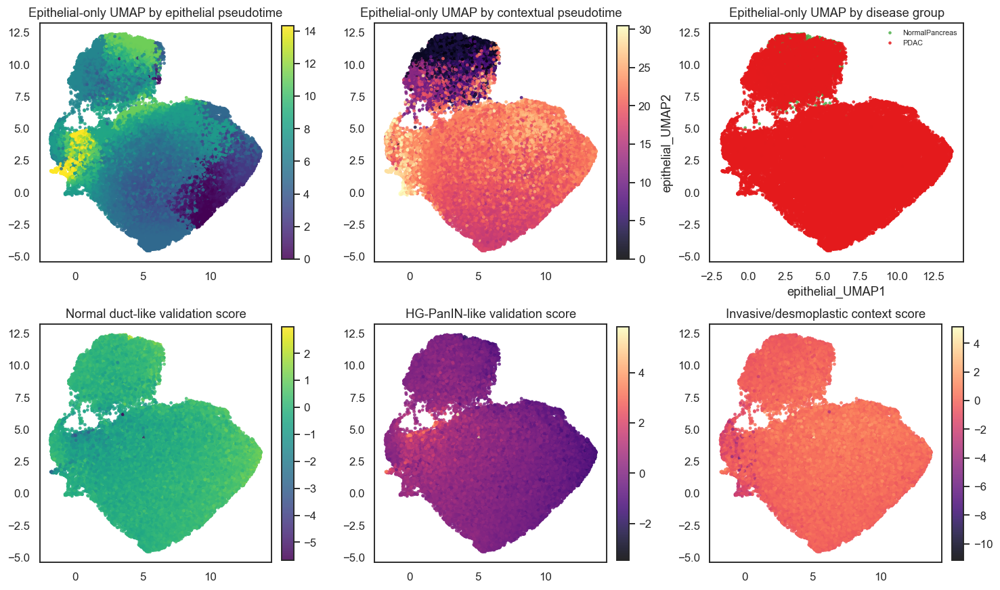

In [24]:

fig, axes = plt.subplots(2, 3, figsize=(13.5, 8.0))
axes = axes.ravel()
disease_palette = {"NormalPancreas": "#4daf4a", "PDAC": "#e41a1c"}

plot_continuous_embedding(
    axes[0],
    epithelial_result_df,
    x="epithelial_UMAP1",
    y="epithelial_UMAP2",
    color="epithelial_pseudotime",
    title="Epithelial-only UMAP by epithelial pseudotime",
)
plot_continuous_embedding(
    axes[1],
    epithelial_result_df,
    x="epithelial_UMAP1",
    y="epithelial_UMAP2",
    color="contextual_pseudotime",
    title="Epithelial-only UMAP by contextual pseudotime",
    cmap="magma",
)
plot_categorical_embedding(
    axes[2],
    epithelial_result_df,
    x="epithelial_UMAP1",
    y="epithelial_UMAP2",
    color="disease_group",
    title="Epithelial-only UMAP by disease group",
    palette=disease_palette,
)
plot_continuous_embedding(
    axes[3],
    epithelial_result_df,
    x="epithelial_UMAP1",
    y="epithelial_UMAP2",
    color="panin_validation__normal_duct_like_score",
    title="Normal duct-like validation score",
    cmap="viridis",
)
plot_continuous_embedding(
    axes[4],
    epithelial_result_df,
    x="epithelial_UMAP1",
    y="epithelial_UMAP2",
    color="panin_validation__hg_panin_like_score",
    title="HG-PanIN-like validation score",
    cmap="magma",
)
plot_continuous_embedding(
    axes[5],
    epithelial_result_df,
    x="epithelial_UMAP1",
    y="epithelial_UMAP2",
    color="panin_validation__invasive_desmoplastic_context_score",
    title="Invasive/desmoplastic context score",
    cmap="magma",
)

plt.tight_layout()
plt.show()


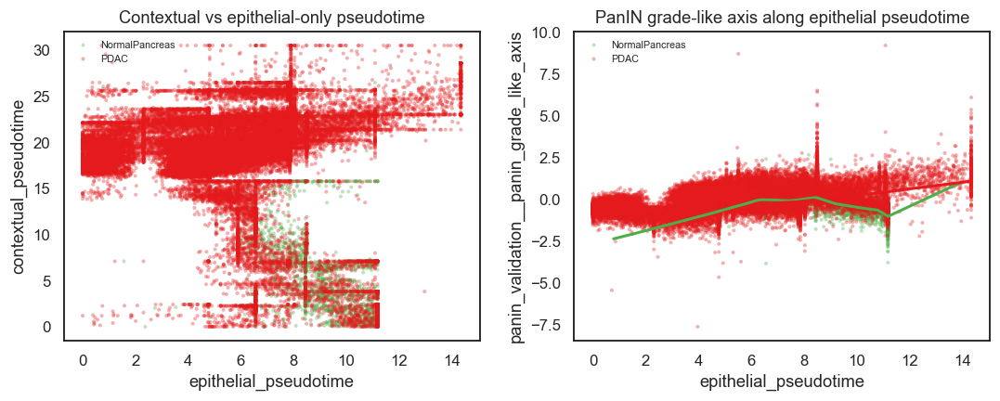

In [25]:

fig, axes = plt.subplots(1, 2, figsize=(10, 4.0))

sns.scatterplot(
    data=epithelial_result_df,
    x="epithelial_pseudotime",
    y="contextual_pseudotime",
    hue="disease_group",
    palette=disease_palette,
    s=7,
    alpha=0.35,
    linewidth=0,
    ax=axes[0],
)
axes[0].set_title("Contextual vs epithelial-only pseudotime")
axes[0].grid(False)
axes[0].legend(frameon=False, fontsize=7, loc="best")

sns.scatterplot(
    data=epithelial_result_df,
    x="epithelial_pseudotime",
    y="panin_validation__panin_grade_like_axis",
    hue="disease_group",
    palette=disease_palette,
    s=7,
    alpha=0.35,
    linewidth=0,
    ax=axes[1],
)
for disease_group, color in disease_palette.items():
    sub = epithelial_result_df[epithelial_result_df["disease_group"] == disease_group]
    smooth = lowess_smooth(
        sub["epithelial_pseudotime"],
        sub["panin_validation__panin_grade_like_axis"],
        frac=0.3,
    )
    if smooth is not None:
        axes[1].plot(smooth[:, 0], smooth[:, 1], color=color, linewidth=2.0)
axes[1].set_title("PanIN grade-like axis along epithelial pseudotime")
axes[1].grid(False)
axes[1].legend(frameon=False, fontsize=7, loc="best")

plt.tight_layout()
plt.show()


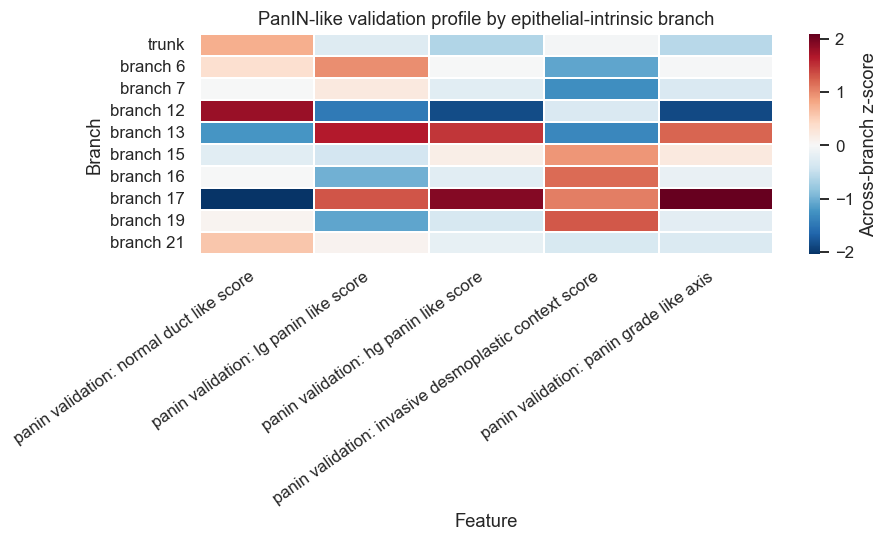

,panin_validation__normal_duct_like_score,panin_validation__lg_panin_like_score,panin_validation__hg_panin_like_score,panin_validation__invasive_desmoplastic_context_score,panin_validation__panin_grade_like_axis
epithelial_major_branch,,,,,
trunk,0.139776,-0.034343,-0.155364,-0.012643,-0.181279
branch 6,0.043936,0.259651,0.028847,-0.218547,0.046944
branch 7,-0.039571,0.080467,-0.037928,-0.256274,-0.069581
branch 12,0.382846,-0.323096,-0.520636,-0.066844,-0.716078
branch 13,-0.319855,0.425146,0.484845,-0.271652,0.565540


In [26]:

epithelial_panin_branch_mean_df = plot_branch_feature_heatmap(
    epithelial_result_df,
    feature_cols=PANIN_VALIDATION_SCORE_COLS,
    group_col="epithelial_major_branch",
    group_order=epithelial_branch_order,
    top_n=TOP_BRANCH_GROUPS_FOR_SUMMARY,
    figsize=(8.5, 4.2),
    title="PanIN-like validation profile by epithelial-intrinsic branch",
    cbar_label="Across-branch z-score",
)
epithelial_panin_branch_mean_df.head()


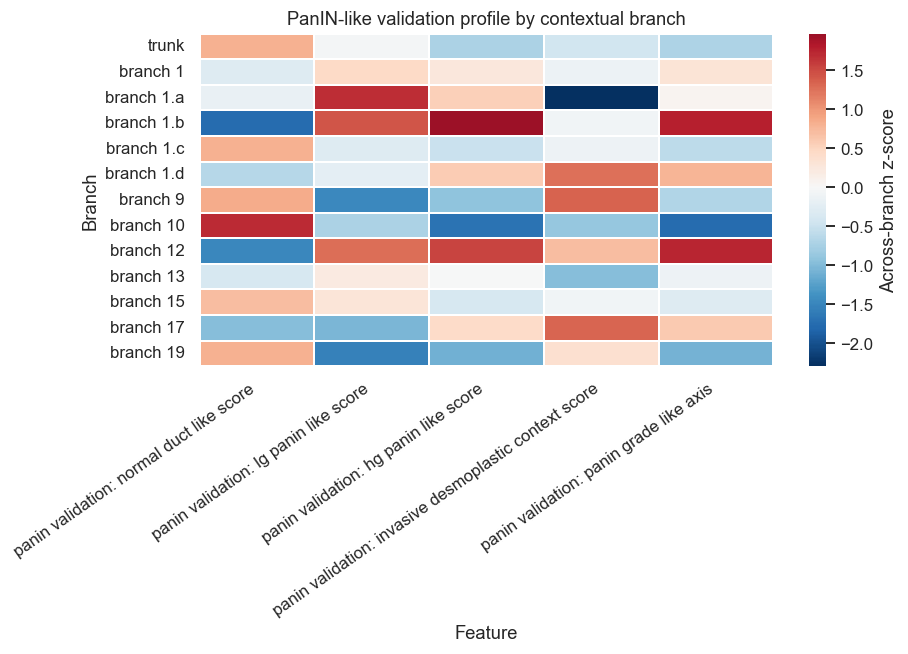

,panin_validation__normal_duct_like_score,panin_validation__lg_panin_like_score,panin_validation__hg_panin_like_score,panin_validation__invasive_desmoplastic_context_score,panin_validation__panin_grade_like_axis
contextual_major_branch,,,,,
trunk,0.135719,0.050880,-0.132810,-0.119502,-0.168578
branch 1,-0.177251,0.183853,0.212314,-0.028418,0.317920
branch 1.a,-0.140630,0.496638,0.310770,-0.703169,0.197812
branch 1.b,-0.592316,0.432920,0.806265,-0.011139,1.024206
branch 1.c,0.137014,-0.011629,-0.059491,-0.021229,-0.121746


In [27]:

contextual_panin_branch_mean_df = plot_branch_feature_heatmap(
    epithelial_result_df,
    feature_cols=PANIN_VALIDATION_SCORE_COLS,
    group_col="contextual_major_branch",
    group_order=major_branch_order,
    top_n=TOP_BRANCH_GROUPS_FOR_SUMMARY,
    figsize=(8.5, 4.2),
    title="PanIN-like validation profile by contextual branch",
    cbar_label="Across-branch z-score",
)
contextual_panin_branch_mean_df.head()


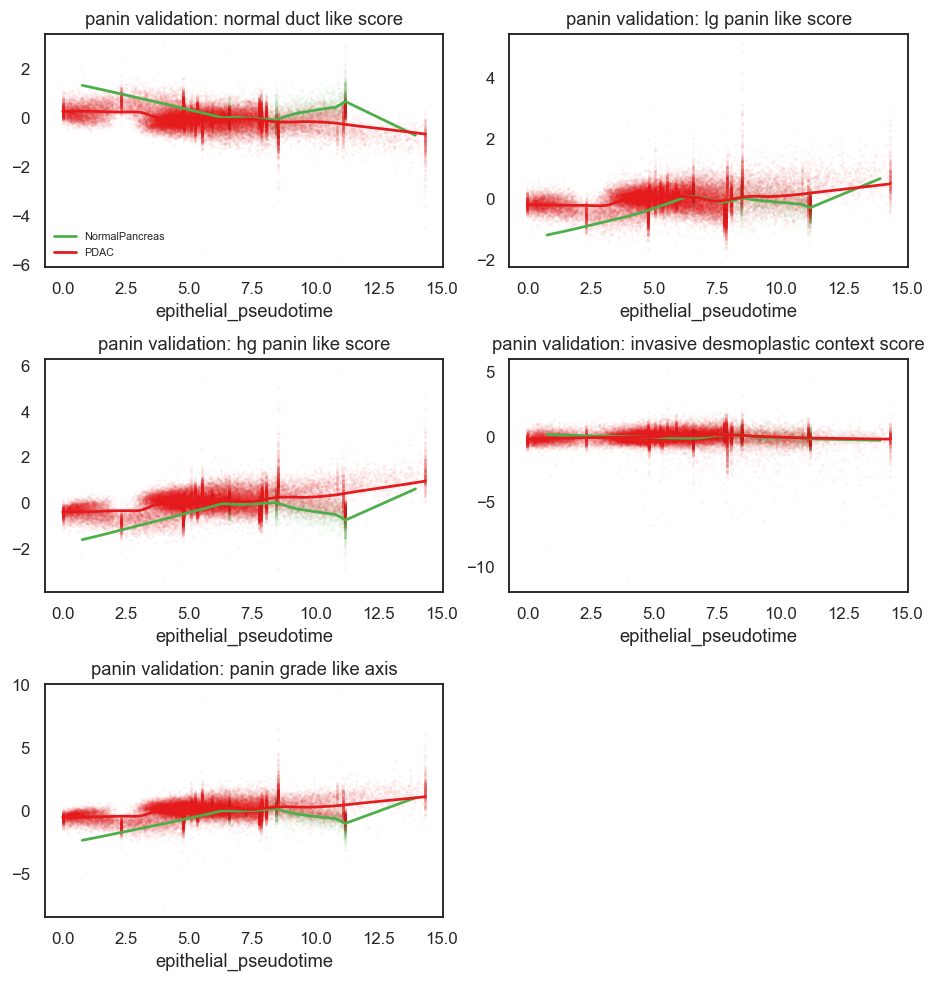

In [28]:

plot_pseudotime_score_trends(
    epithelial_result_df,
    score_cols=PANIN_VALIDATION_SCORE_COLS,
    pseudotime_col="epithelial_pseudotime",
    hue_col="disease_group",
    hue_order=["NormalPancreas", "PDAC"],
    palette=disease_palette,
    n_cols=2,
    figsize_scale=3.0,
    lowess_frac=0.30,
    point_alpha=0.035,
    point_size=4,
    min_points=60,
)



### Project epithelial-only pseudotime back into tissue space

These panels use the same ductal niche cells as the contextual spatial maps, but color them by the epithelial-intrinsic trajectory.


In [29]:

spatial_cell_tables_epithelial = {}
for sample_id in SPATIAL_VIS_SAMPLE_IDS:
    cfg = get_sample_cfg(sample_id)
    spatial_cell_tables_epithelial[sample_id] = build_sample_spatial_cell_df(
        cfg,
        pooled_result_df,
        epithelial_result_df=epithelial_result_df,
        force=False,
    )
    print(
        sample_id,
        spatial_cell_tables_epithelial[sample_id].shape,
        "n epithelial trajectory-assigned cells =",
        int(spatial_cell_tables_epithelial[sample_id]["has_epithelial_niche"].sum()),
    )


40331_1 (1443965, 33) n epithelial trajectory-assigned cells = 42212


/Users/shihongwu/anaconda3/envs/spatioev_env/lib/python3.11/site-packages/anndata/_core/aligned_df.py:68: ImplicitModificationWarning:

Transforming to str index.



34434_1 (1763634, 33) n epithelial trajectory-assigned cells = 385675


/Users/shihongwu/anaconda3/envs/spatioev_env/lib/python3.11/site-packages/anndata/_core/aligned_df.py:68: ImplicitModificationWarning:

Transforming to str index.



33694_1 (2919250, 33) n epithelial trajectory-assigned cells = 379314


/Users/shihongwu/anaconda3/envs/spatioev_env/lib/python3.11/site-packages/anndata/_core/aligned_df.py:68: ImplicitModificationWarning:

Transforming to str index.



35559_1 (1994937, 33) n epithelial trajectory-assigned cells = 430869


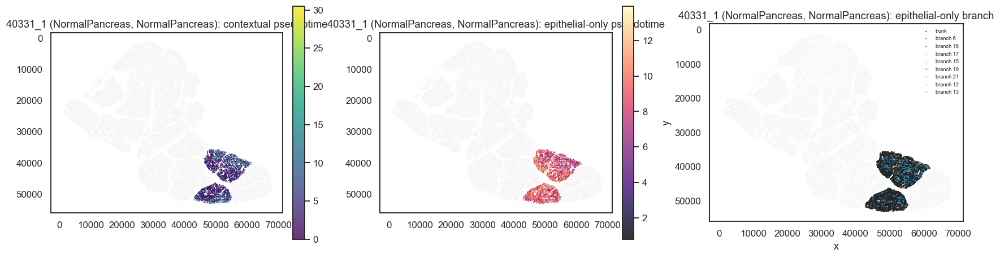

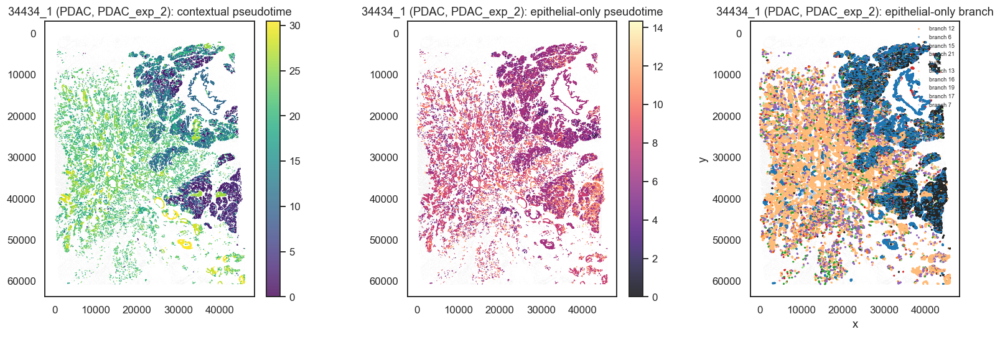

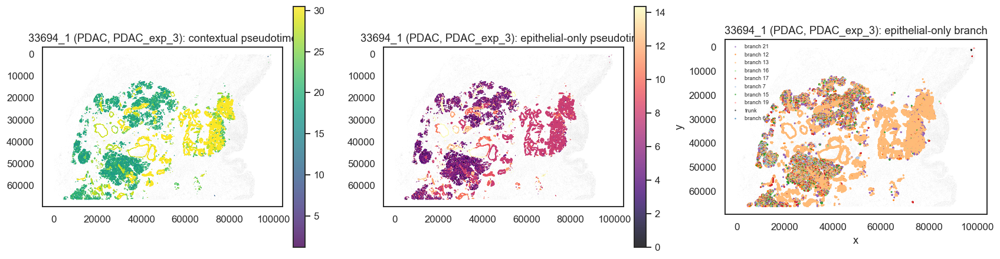

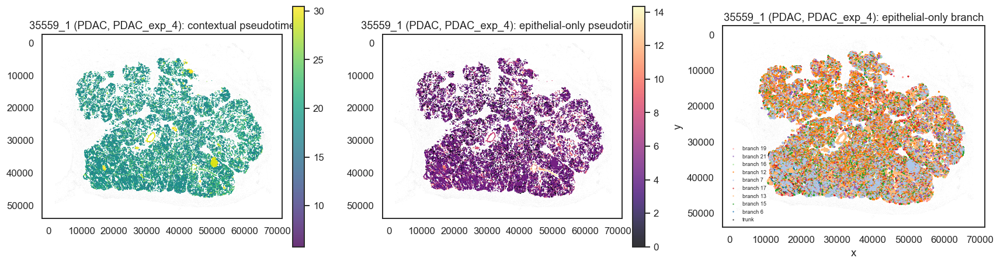

In [30]:

for sample_id in SPATIAL_VIS_SAMPLE_IDS:
    sample_df = spatial_cell_tables_epithelial[sample_id]
    title_prefix = (
        f"{sample_id} "
        f"({sample_df['disease_group'].iloc[0]}, {sample_df['differentiation_label'].iloc[0]})"
    )
    plot_spatial_epithelial_sample_views(
        sample_df,
        title_prefix=title_prefix,
        background_max=140000,
        point_size=0.08,
        niche_point_size=0.18,
    )



## Notes for interpretation

- If the pooled UMAP is dominated by `sample_id` rather than a continuous transition in the pathology axes, do **not** over-interpret the combined tree.
- If the normal pancreas niches sit near the high `pdac_early_duct_anchor_score` end and the PDAC samples bridge outward into more invasive / dedifferentiated states, the pooled tree is likely useful.
- The contextual tree is a ductal niche state trajectory. The epithelial-intrinsic tree is the cleaner sensitivity analysis for epithelial progression.
- PanIN-like validation scores are post hoc interpretability aids, not pathologist-confirmed PanIN grades.
- If needed, the next refinement would be a batch-aware pooled embedding or pathologist ROI validation.
